# Date Preprocessing

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.tsa.api as sm
import numpy as np
sns.set()
data = pd.read_excel('Data/NEER_Economic_Indicators.xlsx', sheet_name = 'main')
data.date = pd.to_datetime(data.date.astype(str), format = '%Y-%d-%m') #convert to correct datetime format
data.index = data.date
data.drop('date', inplace=True, axis = 1)

In [2]:
data #date format is in YYYY-DD-MM

,neer,cpi_adjusted,export_price_index,import_price_index,export_price_index_machinery,export_price_index_manufactured,export_price_index_chem,export_price_index_misc_manufactured,export_price_index_mineral_fuels,cpi_adjusted_clothing_footwear,...,import_price_index_footwear,cpi_adjusted_footwear,import_price_index_plumbing&lighting,import_price_index_furniture,import_price_index_electrical,cpi_adjusted_household_durables,import_price_index_communication,cpi_adjusted_communication,import_price_index_beverages&tobacco,cpi_adjusted_misc
date,,,,,,,,,,,,,,,,,,,,,
2011-01-01,114.5650,90.214,111.960,113.030,111.832,109.235,104.293,98.961,121.899,96.885,...,94.518,93.473,95.891,98.753,107.415,84.130,186.988,103.666,94.914,94.208
2011-02-01,114.8700,90.261,113.635,115.507,111.333,111.804,105.348,97.977,130.476,97.160,...,94.443,94.861,95.845,98.584,107.688,85.976,186.561,103.532,94.729,94.048
2011-03-01,114.9250,90.341,115.333,116.868,109.971,111.402,106.163,98.354,142.362,97.527,...,94.413,95.329,95.779,99.111,107.130,86.238,186.661,103.131,94.222,94.193
2011-04-01,115.8080,91.316,116.138,117.220,109.169,111.878,106.324,97.863,148.487,97.604,...,94.385,94.530,95.510,99.415,106.644,88.010,170.264,103.074,93.889,94.190
2011-05-01,116.3100,91.182,113.871,115.186,108.145,109.083,105.877,97.459,140.853,97.907,...,96.168,93.879,95.464,99.494,105.838,88.758,170.089,103.077,93.677,94.097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-01,125.7740,100.027,90.118,90.992,98.538,98.255,90.592,101.658,62.131,94.951,...,103.499,92.396,105.726,106.511,99.897,100.596,86.745,101.125,95.065,98.703
2020-11-01,125.6000,99.938,89.746,91.761,96.657,99.053,91.392,100.650,64.455,93.897,...,103.692,92.552,105.726,106.556,99.443,100.437,86.535,100.944,94.960,98.457
2020-12-01,125.4375,100.301,90.472,93.418,95.872,100.772,92.000,99.676,69.859,94.872,...,103.661,93.582,105.726,105.308,99.687,100.431,86.307,101.010,96.210,98.721


In [4]:
def tsplot(y, lags=50, figsize=(10, 8), title='Time Series Analysis Plots', style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))    
        y.plot(ax=ts_ax)
        p_value = sm.adfuller(y)[1]
        ts_ax.set_title(f'{title}\n Dickey-Fuller: p={p_value:.5f}')
        sm.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.5)
        sm.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.5)
        plt.tight_layout()
    return

In [5]:
#Consider past 10 years data, from Jan 2011 to Feb 2011
start_date = '2011-01-01'
end_date = '2021-02-01'
data=data.loc[start_date:end_date]

# Time Series Analysis (NEER, Adjusted CPI, Import Price Index)

## NEER

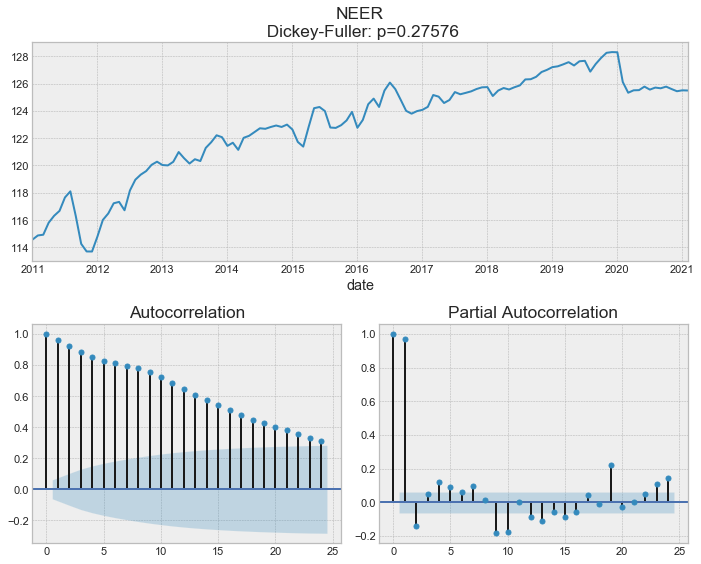

In [6]:
tsplot(data.neer, lags=24, title='NEER')

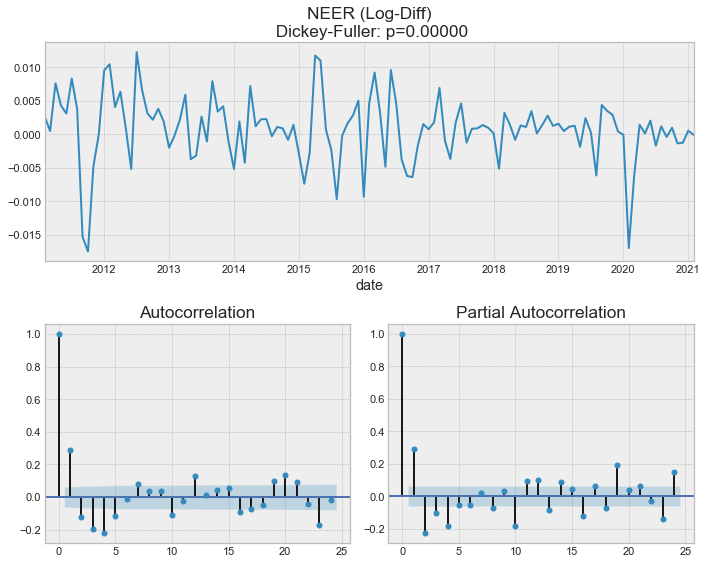

In [8]:
tsplot(np.log(data.neer+1).diff().dropna(), lags=24, title = 'NEER (Log-Diff)')

## Consumer Price Index (CPI) Adjusted

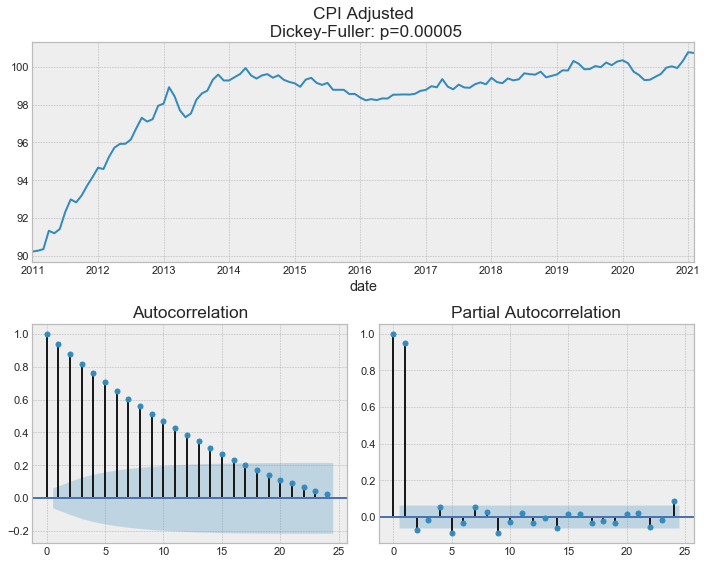

In [18]:
tsplot(data['cpi_adjusted'], lags=24, title = 'CPI Adjusted')

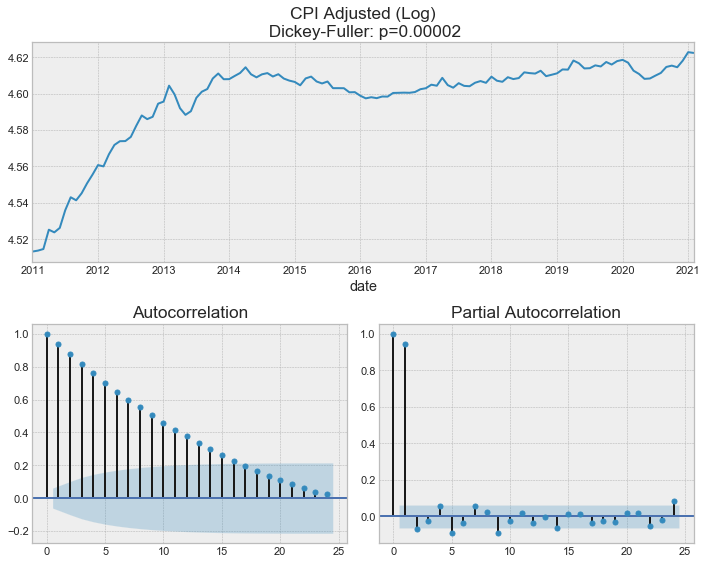

In [10]:
tsplot(np.log(data['cpi_adjusted']+1), lags=24, title = 'CPI Adjusted (Log)')

## Import Price Index

C:\Users\Reverse\AppData\Local\Programs\Python\Python37\lib\site-packages\statsmodels\regression\linear_model.py:1434: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


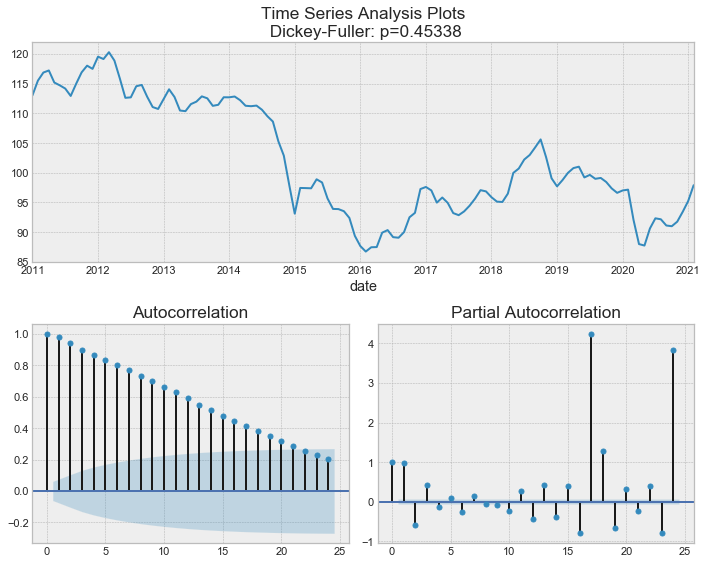

In [118]:
tsplot(data.import_price_index, lags=24)

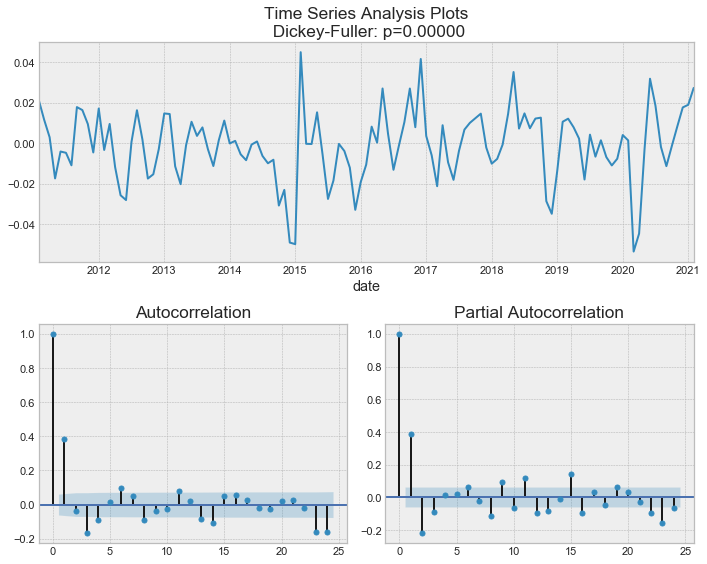

In [12]:
tsplot(np.log(data.import_price_index+1).diff().dropna(), lags=24)

## Import Price Index Non Oil

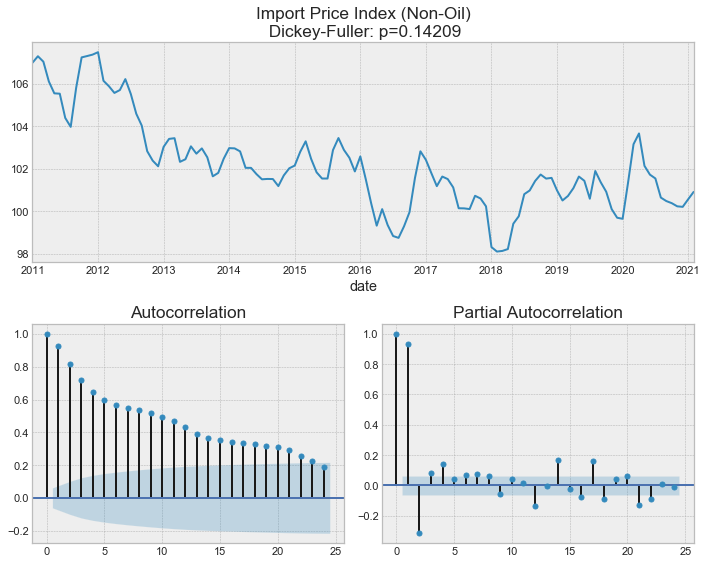

In [238]:
tsplot(data.import_price_index_non_oil, lags=24, title="Import Price Index (Non-Oil)")

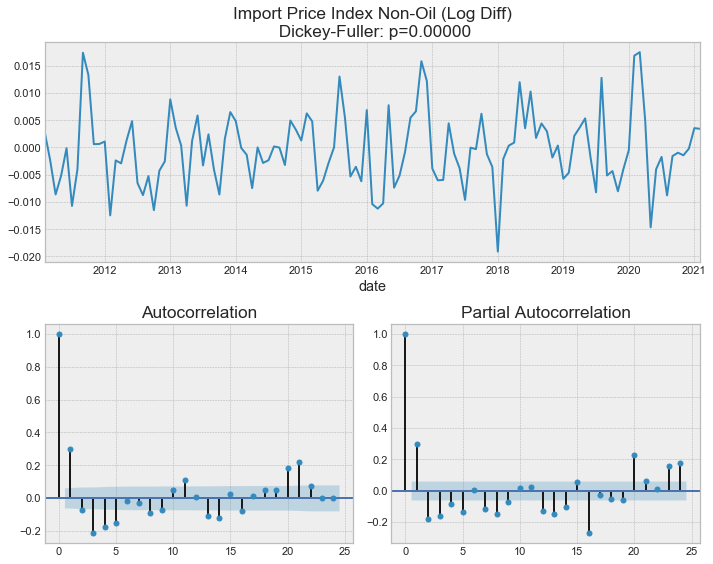

In [13]:
tsplot(np.log(data.import_price_index_non_oil+1).diff().dropna(), lags=24, title="Import Price Index Non-Oil (Log Diff)")

## Export Price Index

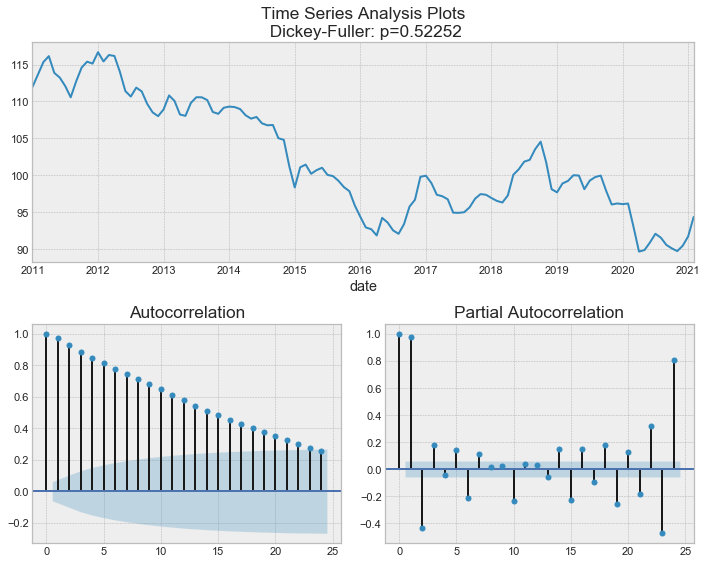

In [65]:
tsplot(data.export_price_index, lags=24)

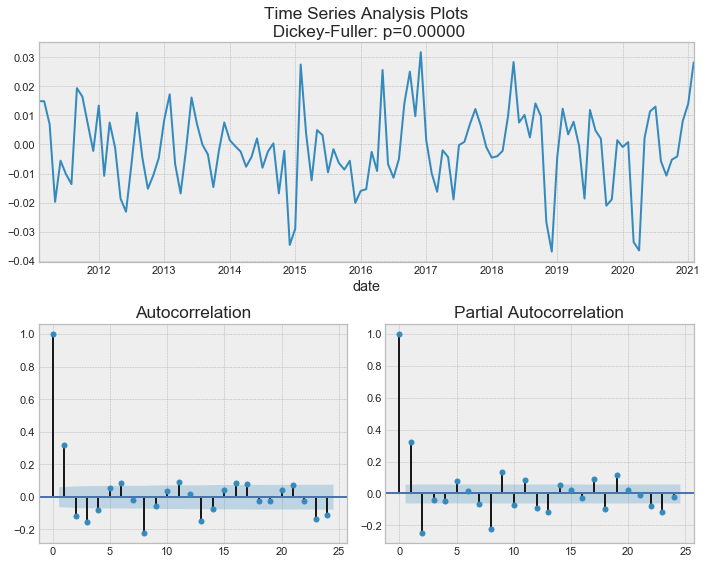

In [68]:
tsplot(np.log(data.export_price_index).diff().dropna(), lags=24)

# Main Model (NEER, Import Price Index, CPI)
## VAR

In [14]:
data = data.dropna(axis=1)
data.columns

Index(['neer', 'cpi_adjusted', 'export_price_index', 'import_price_index',
       'export_price_index_machinery', 'export_price_index_manufactured',
       'export_price_index_chem', 'export_price_index_misc_manufactured',
       'export_price_index_mineral_fuels', 'cpi_adjusted_clothing_footwear',
       'cpi_adjusted_education', 'cpi_adjusted_healthcare',
       'cpi_adjusted_transport', 'cpi_adjusted_recreation',
       'cpi_adjusted_housing_utilities', 'import_price_index_non_oil',
       'import_price_index_food', 'cpi_adjusted_food',
       'import_price_index_clothing', 'cpi_adjusted_clothing',
       'import_price_index_footwear', 'cpi_adjusted_footwear',
       'import_price_index_plumbing&lighting', 'import_price_index_furniture',
       'import_price_index_electrical', 'cpi_adjusted_household_durables',
       'import_price_index_communication', 'cpi_adjusted_communication',
       'import_price_index_beverages&tobacco', 'cpi_adjusted_misc'],
      dtype='object')

In [167]:
data_trans = pd.concat([
                        np.log(data.neer+1).diff().dropna(), 
                        np.log(data.import_price_index+1).diff().dropna(),
                        np.log(data['cpi_adjusted']+1),
                       ], axis = 1)
data_trans = data_trans.iloc[1:] #since some variables use diff

In [168]:
data_trans

,neer,import_price_index,cpi_adjusted
date,,,
2011-02-01,0.002636,0.021490,4.513724
2011-03-01,0.000475,0.011614,4.514600
2011-04-01,0.007588,0.002982,4.525217
2011-05-01,0.004288,-0.017355,4.523765
2011-06-01,0.003085,-0.004062,4.526214
...,...,...,...
2020-10-01,0.000959,-0.001325,4.615388
2020-11-01,-0.001373,0.008325,4.614506
2020-12-01,-0.001284,0.017705,4.618096


In [169]:
from statsmodels.tsa.api import VAR
order = 15
model = VAR(data_trans)
model.select_order(order).summary()

,AIC,BIC,FPE,HQIC
0,-28.26,-28.18,5.340e-13,-28.23
1,-31.03,-30.73*,3.348e-14,-30.91*
2,-31.04*,-30.52,3.296e-14*,-30.83
3,-31.01,-30.26,3.410e-14,-30.71
4,-30.92,-29.94,3.739e-14,-30.52
5,-30.79,-29.59,4.266e-14,-30.30
6,-30.64,-29.21,5.002e-14,-30.06
7,-30.50,-28.84,5.801e-14,-29.82
8,-30.41,-28.53,6.356e-14,-29.65
9,-30.32,-28.21,7.089e-14,-29.46


In [170]:
# for o in list(range(1, 20)):
orders = model.select_order(order).selected_orders
orders
for o in orders.values():
    if o == 0:
        continue
    print(f'Order: {o}')
    results = model.fit(o)
    print(results.is_stable())
    print(results.test_whiteness())
    print()


Order: 2
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 67.772, critical value: 92.808>, p-value: 0.619>

Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 86.627, critical value: 103.010>, p-value: 0.314>

Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 86.627, critical value: 103.010>, p-value: 0.314>

Order: 2
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 67.772, critical value: 92.808>, p-v

### Impulse Response Analysis

In [171]:
results = model.fit(2) 

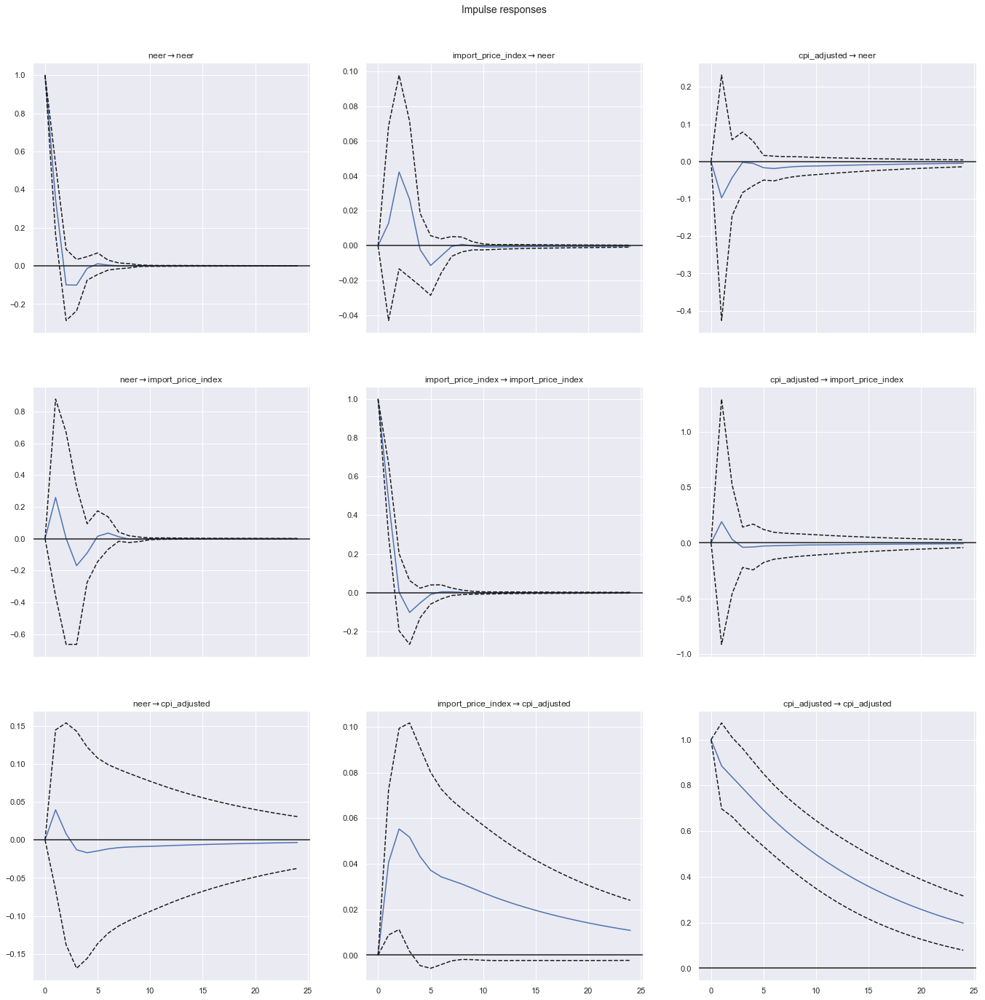

In [172]:
irf = results.irf(24)
irf_plot = irf.plot(orth=False,figsize=(20,20))

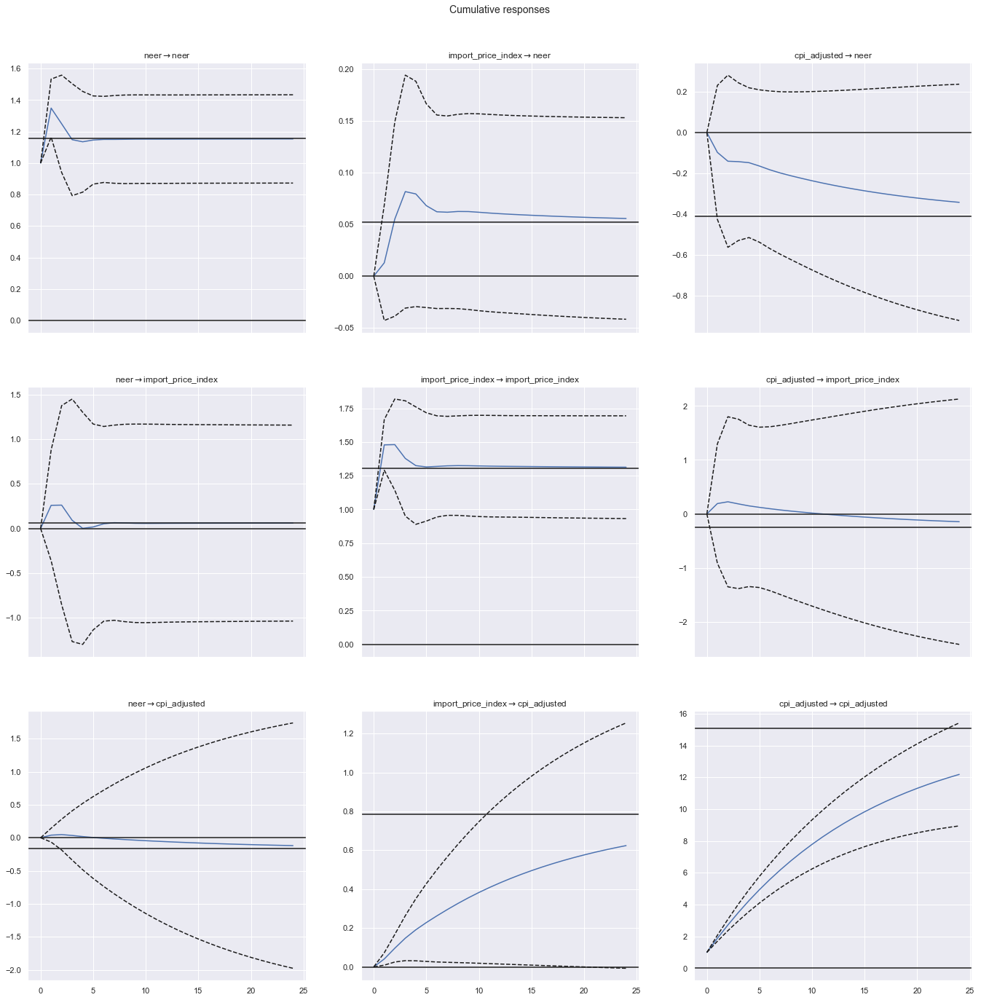

In [173]:
irf_cum_plot = irf.plot_cum_effects(orth=False,figsize=(20,20))

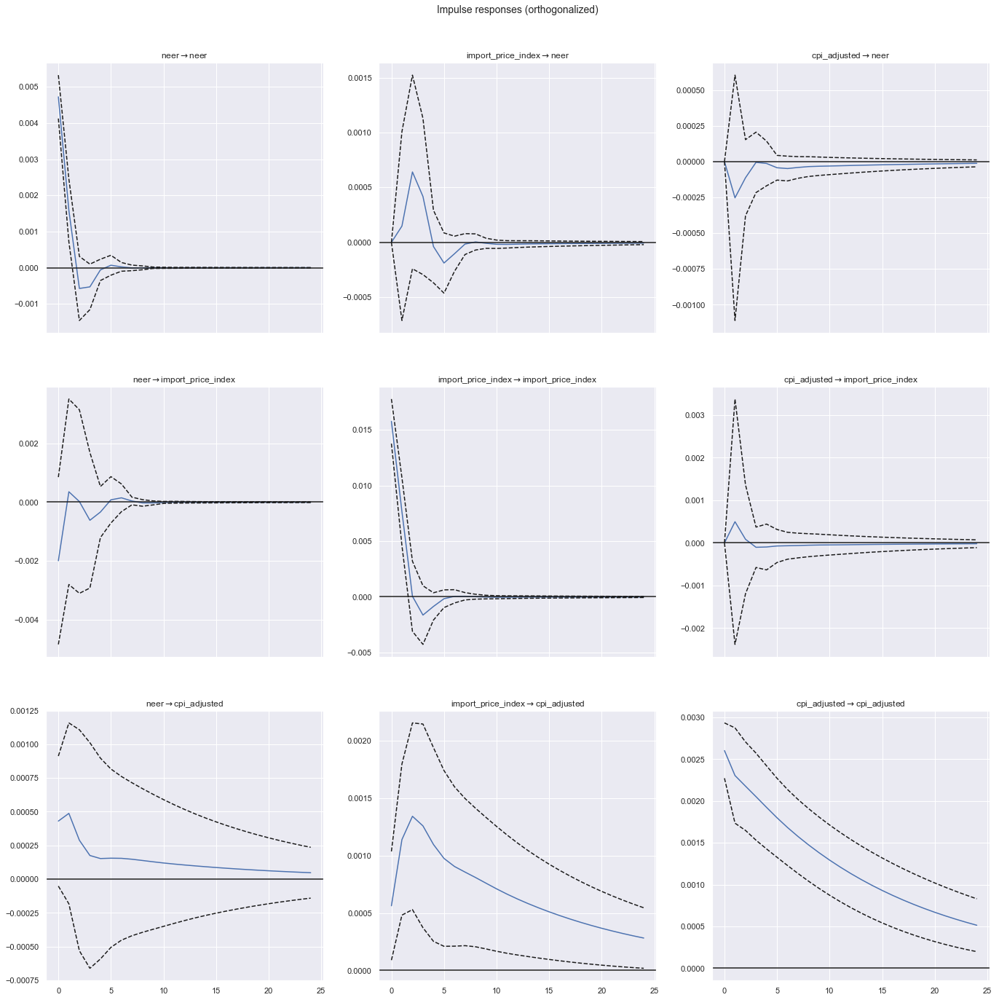

In [174]:
irf_orth_plot = irf.plot(orth=True,figsize=(20,20))

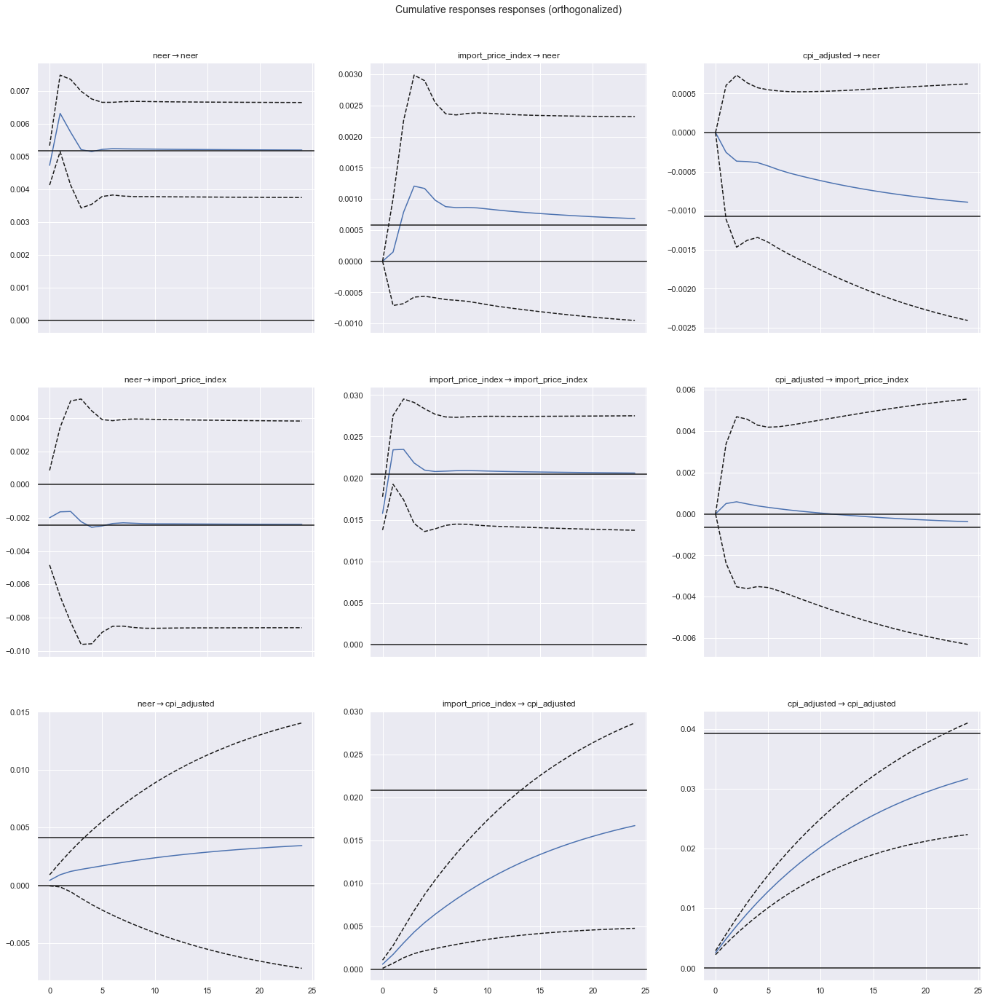

In [175]:
irf_orth_cum_plot = irf.plot_cum_effects(orth=True,figsize=(20,20))

### Forecast Error Decomposition

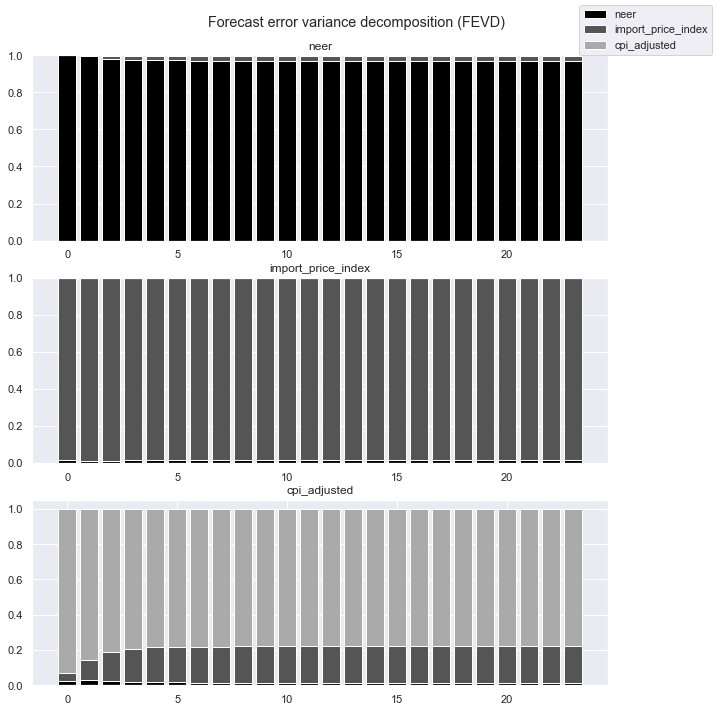

In [55]:
fevd = results.fevd(24).plot()

## Cointegration Testing/VECM
- From the cointegration test, r = 3 if using Crit-95% and r=1 if using Crit-99%.
- Hence, try running a VAR in levels and a VECM with coint_rank = 1

In [188]:
from statsmodels.tsa.vector_ar.vecm import VECM, coint_johansen

def print_coint_results(coint_results):
    print ('--------------------------------------------------')
    print ('--> Trace Statistics')
    print ('variable statistic Crit-90% Crit-95%  Crit-99%')
    for i in range(len(coint_results.lr1)):
        print ('r =', i, '\t', round(coint_results.lr1[i], 4), coint_results.cvt[i, 0], coint_results.cvt[i, 1], coint_results.cvt[i, 2])
    print ('--------------------------------------------------')

cols = ['neer', 'import_price_index','cpi_adjusted']
coint_results = coint_johansen(np.log(data[cols]+1), det_order=0, k_ar_diff=1)
print_coint_results(coint_results)

--------------------------------------------------
--> Trace Statistics
variable statistic Crit-90% Crit-95%  Crit-99%
r = 0 	 45.6717 27.0669 29.7961 35.4628
r = 1 	 18.3229 13.4294 15.4943 19.9349
r = 2 	 6.8566 2.7055 3.8415 6.6349
--------------------------------------------------


### VAR in Levels

In [29]:
data_levels = pd.concat([
                        np.log(data.neer+1),
                        np.log(data.import_price_index+1),
                        np.log(data['cpi_adjusted']+1),
                       ], axis = 1)


In [30]:
from statsmodels.tsa.api import VAR
order = 15
model_levels = VAR(data_levels)
model_levels.select_order(order).summary()
#Order: 1, 2, 4

C:\Users\Reverse\AppData\Local\Programs\Python\Python37\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


,AIC,BIC,FPE,HQIC
0,-23.45,-23.38,6.539e-11,-23.42
1,-30.94,-30.64*,3.642e-14,-30.82
2,-31.06,-30.54,3.240e-14,-30.85*
3,-31.09*,-30.34,3.165e-14*,-30.78
4,-30.99,-30.01,3.495e-14,-30.59
5,-30.93,-29.73,3.732e-14,-30.44
6,-30.79,-29.37,4.281e-14,-30.22
7,-30.69,-29.05,4.759e-14,-30.03
8,-30.64,-28.77,5.072e-14,-29.88
9,-30.53,-28.44,5.698e-14,-29.68


In [31]:
orders = model_levels.select_order(order).selected_orders
orders

{'aic': 3, 'bic': 1, 'hqic': 2, 'fpe': 3}

In [32]:
# for o in list(range(1, 20)):
for o in orders.values():
    if o == 0:
        continue
    print(f'Order: {o}')
    results = model_levels.fit(o)
    print(results.is_stable())
    print(results.test_whiteness())
    print()


Order: 3
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 60.783, critical value: 82.529>, p-value: 0.556>

Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: reject at 5% significance level. Test statistic: 127.286, critical value: 103.010>, p-value: 0.001>

Order: 2
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 79.716, critical value: 92.808>, p-value: 0.249>

Order: 3
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 60.783, critical value: 82.529>, p-value: 0.

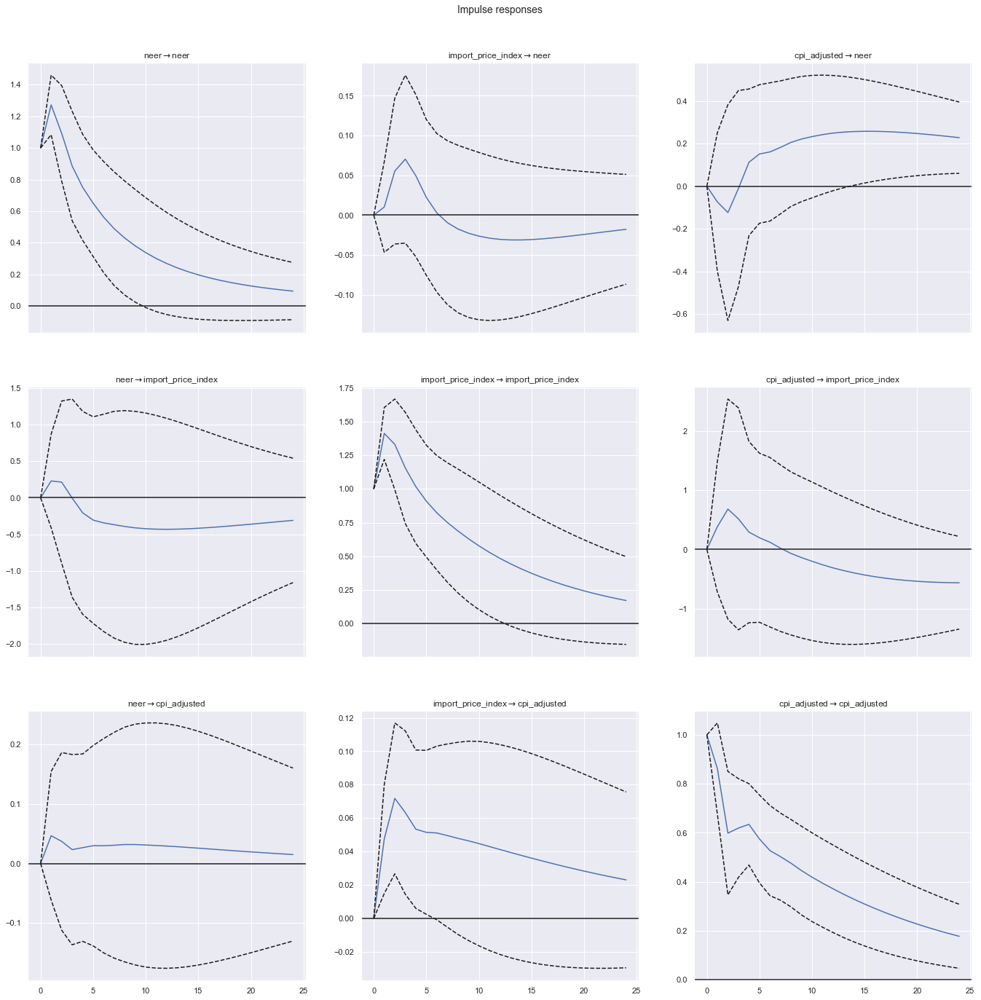

In [39]:
results_levels= model_levels.fit(3)
irf_levels = results_levels.irf(24)
irf_plot_levels = irf_levels.plot(orth=False,figsize=(20,20))

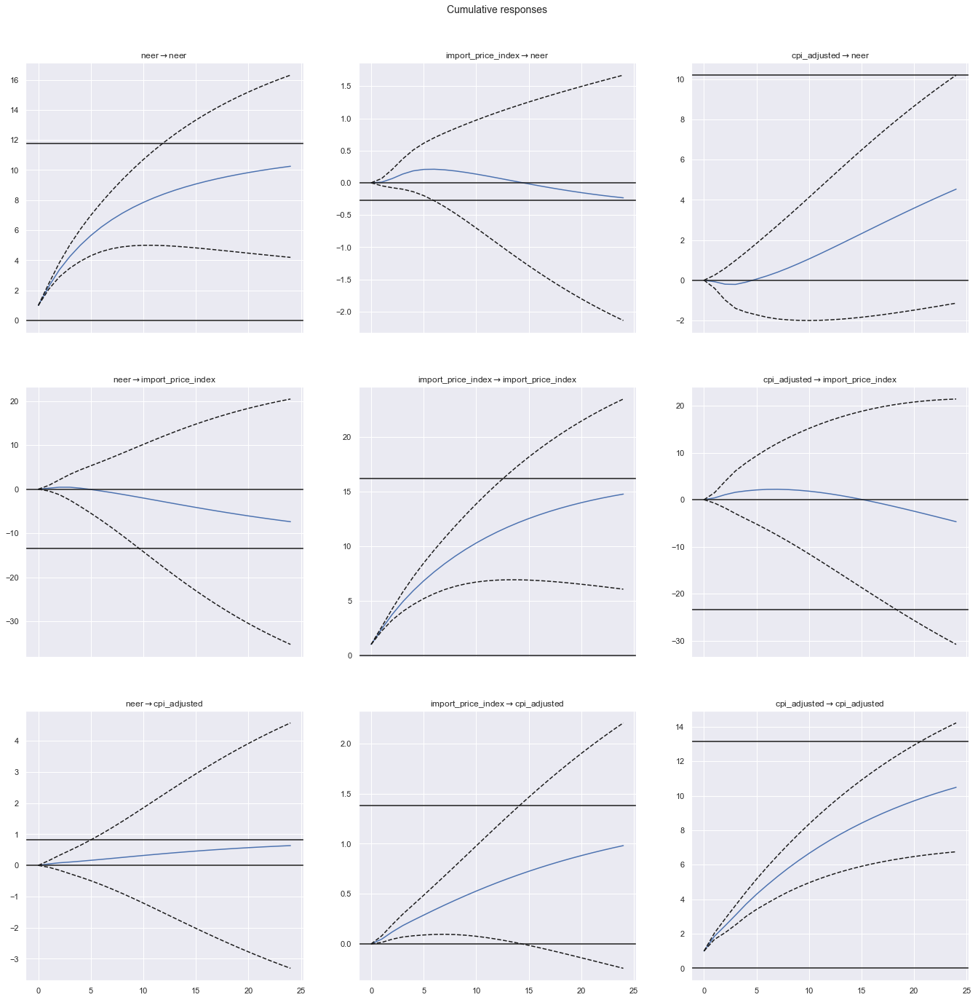

In [40]:
irf_cum_plot_levels = irf_levels.plot_cum_effects(orth=False,figsize=(20,20))

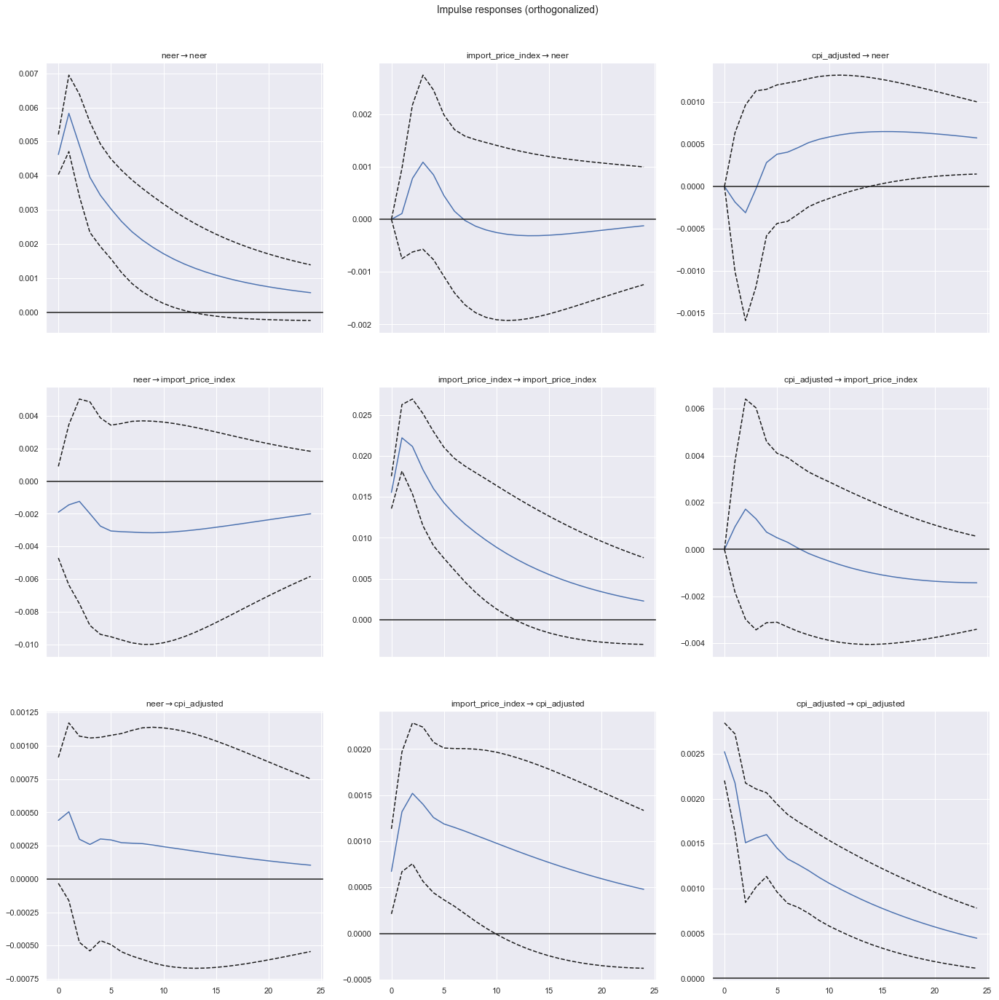

In [41]:
irf_plot_levels = irf_levels.plot(orth=True,figsize=(20,20))

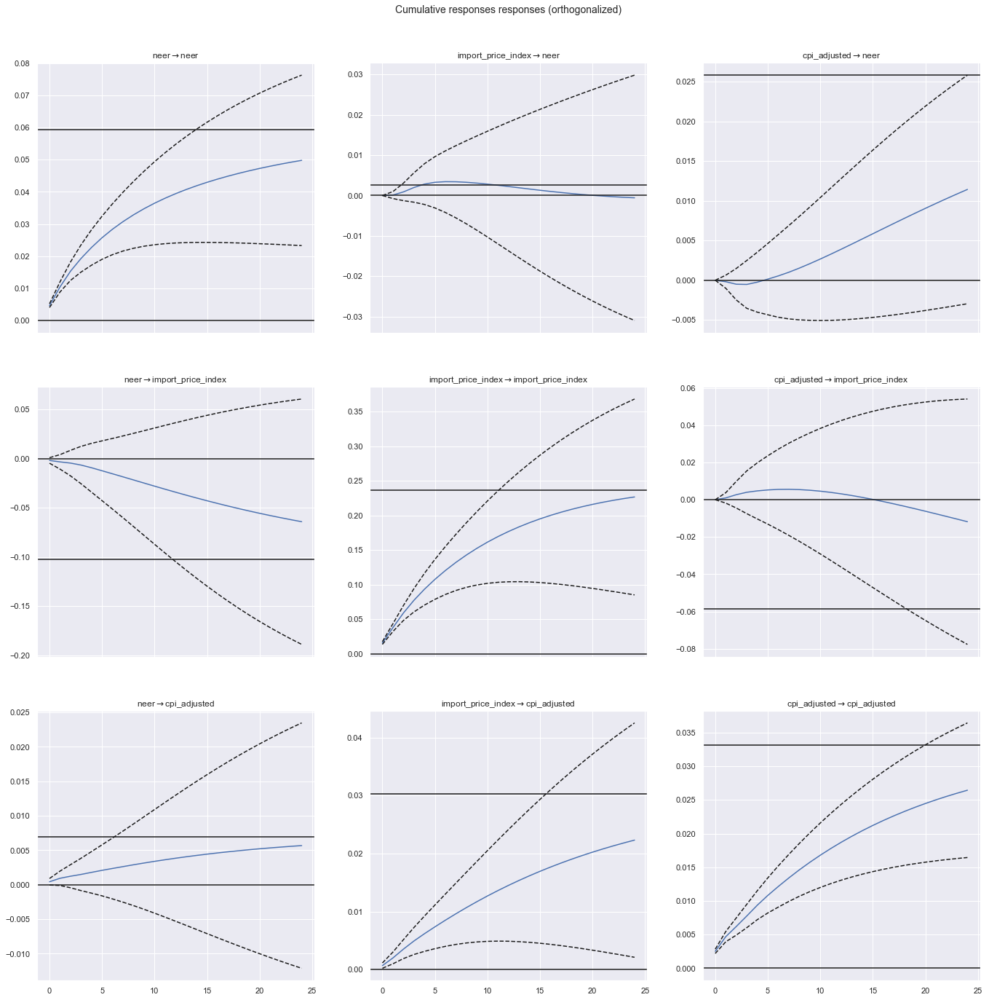

In [42]:
irf_cum_plot_levels = irf_levels.plot_cum_effects(orth=True,figsize=(20,20))

In [189]:
vecm_model = VECM(endog = np.log(data[cols]+1), k_ar_diff = 1, coint_rank = 1, deterministic = 'co')
vecm_fit = vecm_model.fit()
vecm_fit.summary()
print(vecm_fit.test_whiteness())

<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 88.958, critical value: 99.617>, p-value: 0.186>


C:\Users\Reverse\AppData\Local\Programs\Python\Python37\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


In [190]:
vecm_irf = vecm_fit.irf(24)

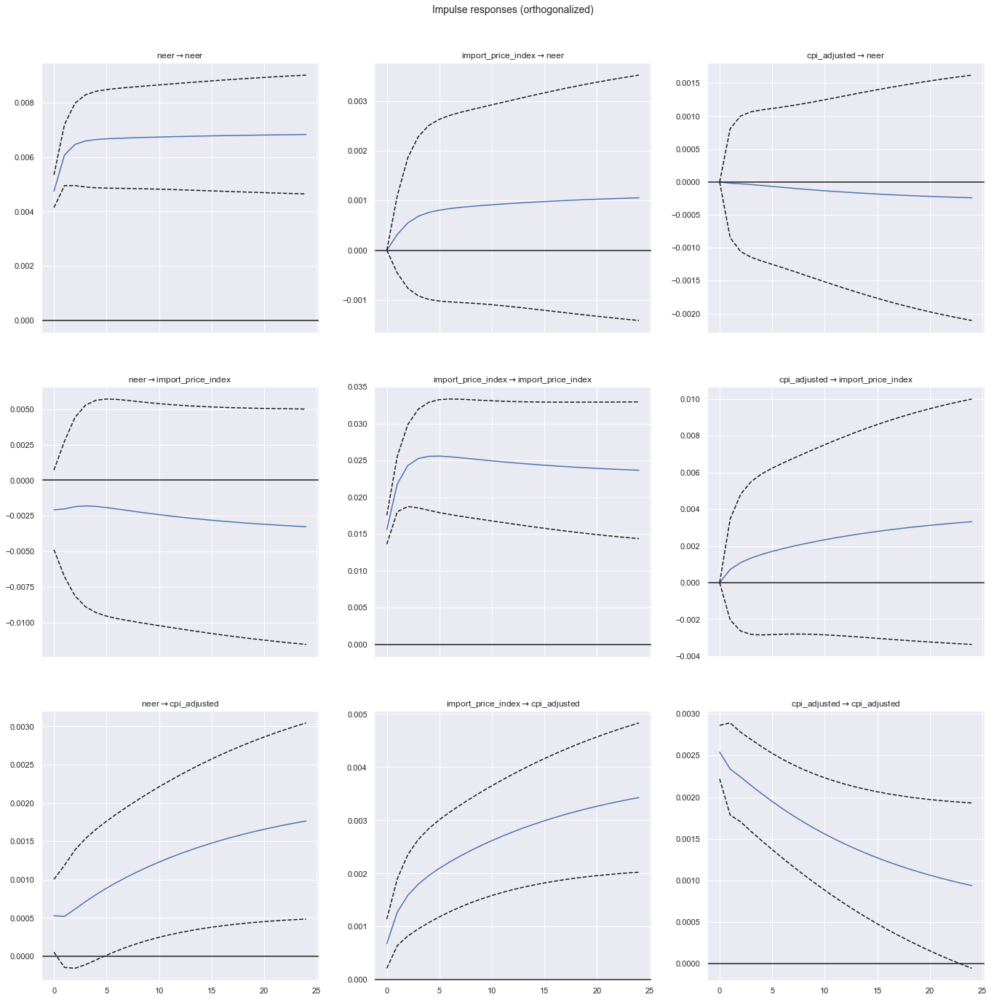

In [191]:
vecm_irf_plot = vecm_irf.plot(figsize=(20,20), orth=True)

# Alternative Model: NEER, Import Price Index (Non-Oil), CPI Adjusted

## VAR Model

In [177]:
data_trans = pd.concat([
                        np.log(data.neer+1).diff().dropna(), 
                        np.log(data.import_price_index_non_oil+1).diff().dropna(),
                        np.log(data['cpi_adjusted']+1),
                       ], axis = 1)
data_trans = data_trans.iloc[1:] #since some variables use diff
data_trans

,neer,import_price_index_non_oil,cpi_adjusted
date,,,
2011-02-01,0.002636,0.002830,4.513724
2011-03-01,0.000475,-0.002367,4.514600
2011-04-01,0.007588,-0.008645,4.525217
2011-05-01,0.004288,-0.005233,4.523765
2011-06-01,0.003085,-0.000160,4.526214
...,...,...,...
2020-10-01,0.000959,-0.000986,4.615388
2020-11-01,-0.001373,-0.001461,4.614506
2020-12-01,-0.001284,-0.000237,4.618096


In [178]:
from statsmodels.tsa.api import VAR
order = 15
model = VAR(data_trans)
model.select_order(order).summary()

,AIC,BIC,FPE,HQIC
0,-30.77,-30.70,4.330e-14,-30.74
1,-33.41*,-33.11*,3.088e-15*,-33.29*
2,-33.36,-32.83,3.267e-15,-33.14
3,-33.34,-32.58,3.326e-15,-33.03
4,-33.20,-32.22,3.818e-15,-32.81
5,-33.10,-31.89,4.257e-15,-32.61
6,-32.98,-31.55,4.812e-15,-32.40
7,-32.94,-31.28,5.043e-15,-32.27
8,-32.87,-30.99,5.430e-15,-32.11
9,-32.78,-30.67,6.017e-15,-31.93


In [179]:
# for o in list(range(1, 20)):
orders = model.select_order(order).selected_orders
orders
for o in orders.values():
    if o == 0:
        continue
    print(f'Order: {o}')
    results = model.fit(o)
    print(results.is_stable())
    print(results.test_whiteness())
    print()


Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 85.841, critical value: 103.010>, p-value: 0.335>

Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 85.841, critical value: 103.010>, p-value: 0.335>

Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 85.841, critical value: 103.010>, p-value: 0.335>

Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 85.841, critical value: 103.010>, p

### Impulse Response Analysis

In [180]:
results = model.fit(1) 

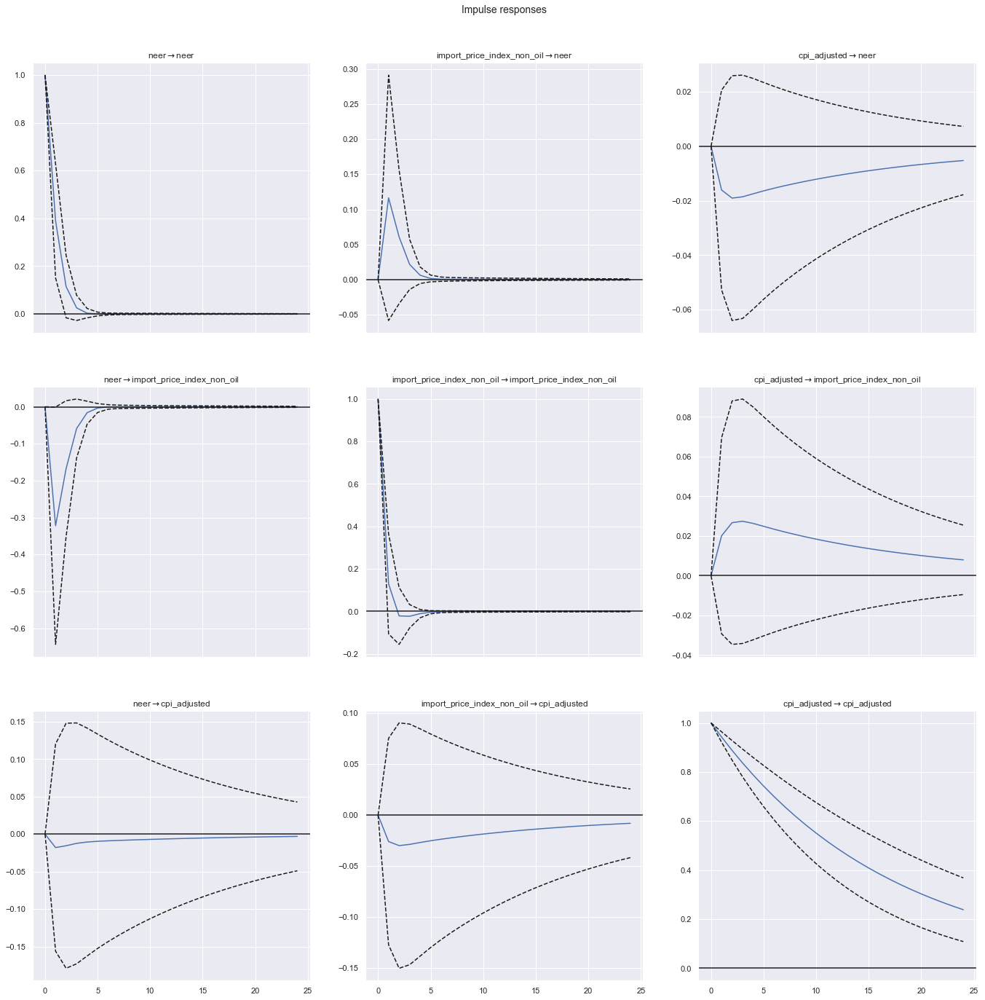

In [181]:
irf = results.irf(24)
irf_plot = irf.plot(orth=False,figsize=(20,20))

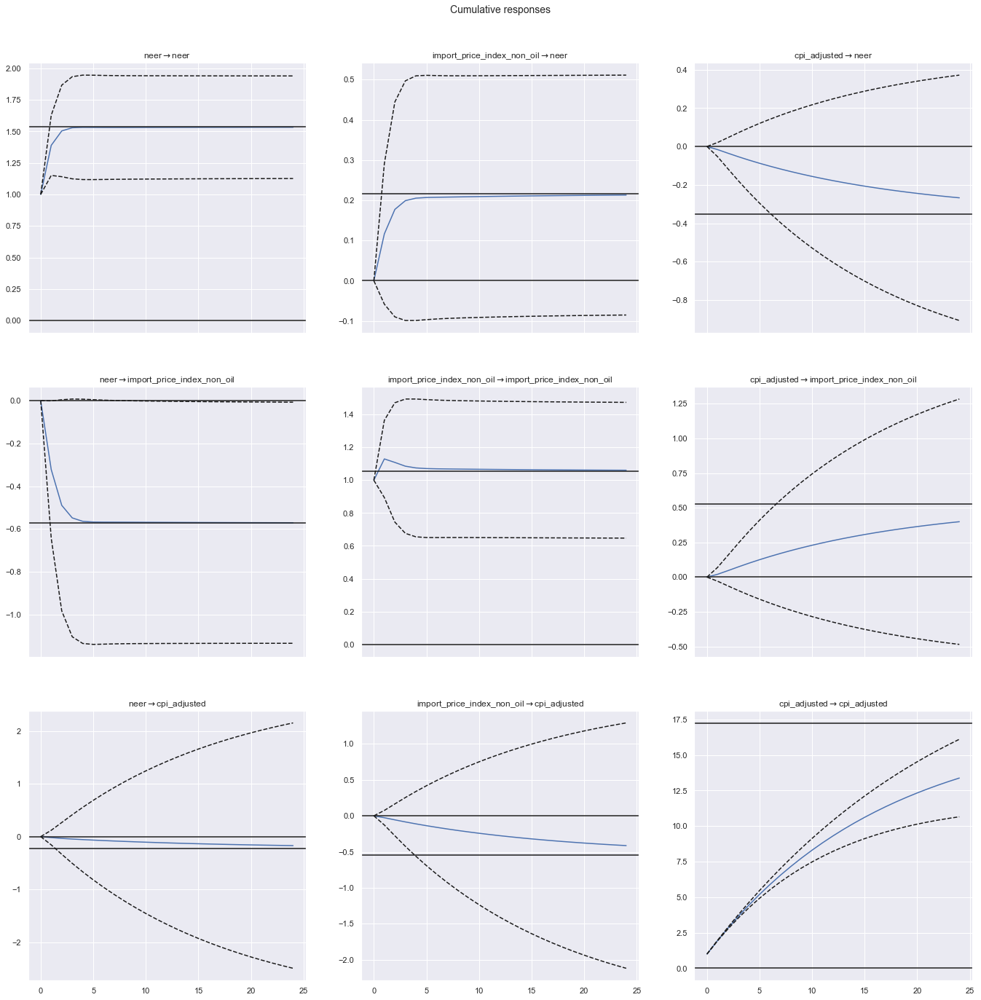

In [182]:
irf_cum_plot = irf.plot_cum_effects(orth=False,figsize=(20,20))

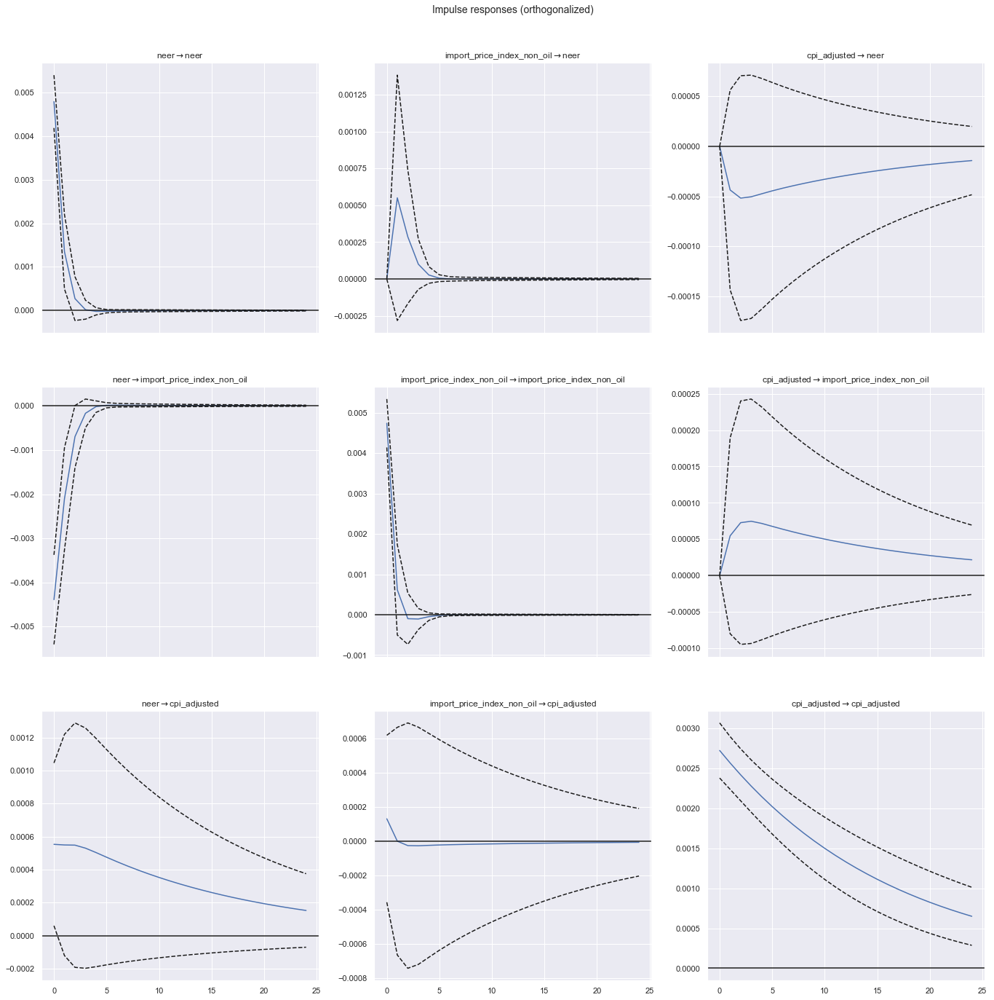

In [183]:
irf_orth_plot = irf.plot(orth=True,figsize=(20,20))

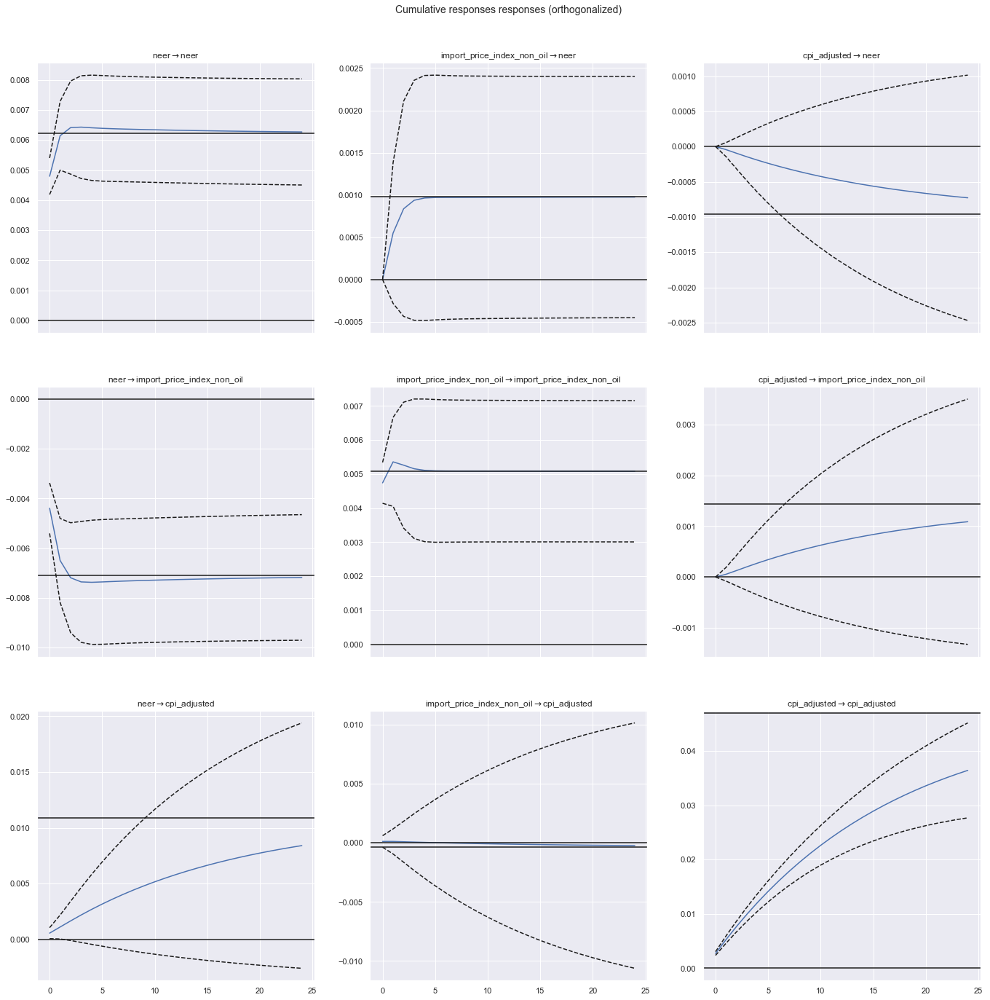

In [184]:
irf_orth_cum_plot = irf.plot_cum_effects(orth=True,figsize=(20,20))

### Forecast Error Decomposition

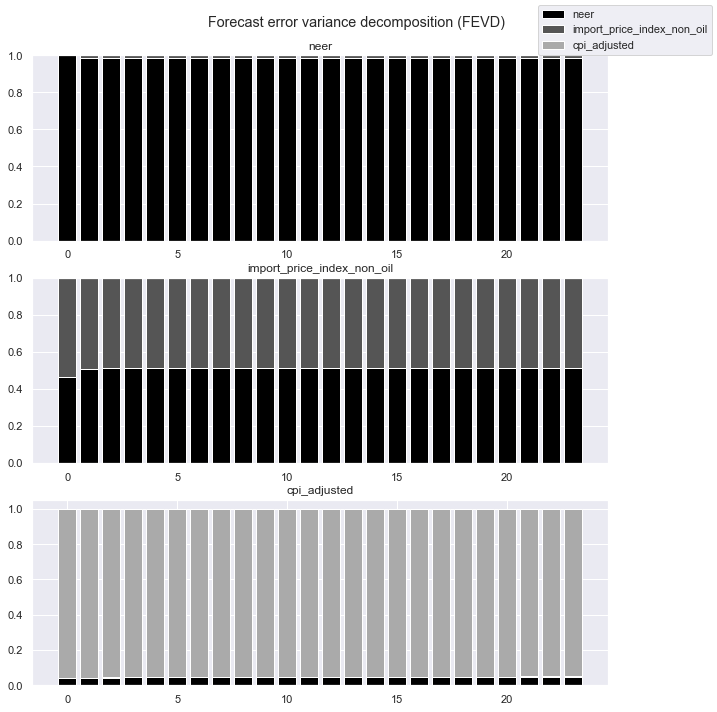

In [185]:
fevd = results.fevd(24).plot()

## Cointegration Test/VECM
Results indicate that r = 3 = k, hence use VAR in levels

In [192]:
cols = ['neer', 'import_price_index_non_oil','cpi_adjusted']
coint_results = coint_johansen(np.log(data[cols]+1), det_order=0, k_ar_diff=1)
print_coint_results(coint_results)

--------------------------------------------------
--> Trace Statistics
variable statistic Crit-90% Crit-95%  Crit-99%
r = 0 	 48.0792 27.0669 29.7961 35.4628
r = 1 	 24.3416 13.4294 15.4943 19.9349
r = 2 	 6.591 2.7055 3.8415 6.6349
--------------------------------------------------


In [193]:
vecm_model = VECM(endog = np.log(data[cols]+1), k_ar_diff = 1, coint_rank = 1, deterministic = 'co')
vecm_fit = vecm_model.fit()
vecm_fit.summary()
print(vecm_fit.test_whiteness())

<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 83.355, critical value: 99.617>, p-value: 0.318>


C:\Users\Reverse\AppData\Local\Programs\Python\Python37\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


In [194]:
vecm_irf = vecm_fit.irf(24)

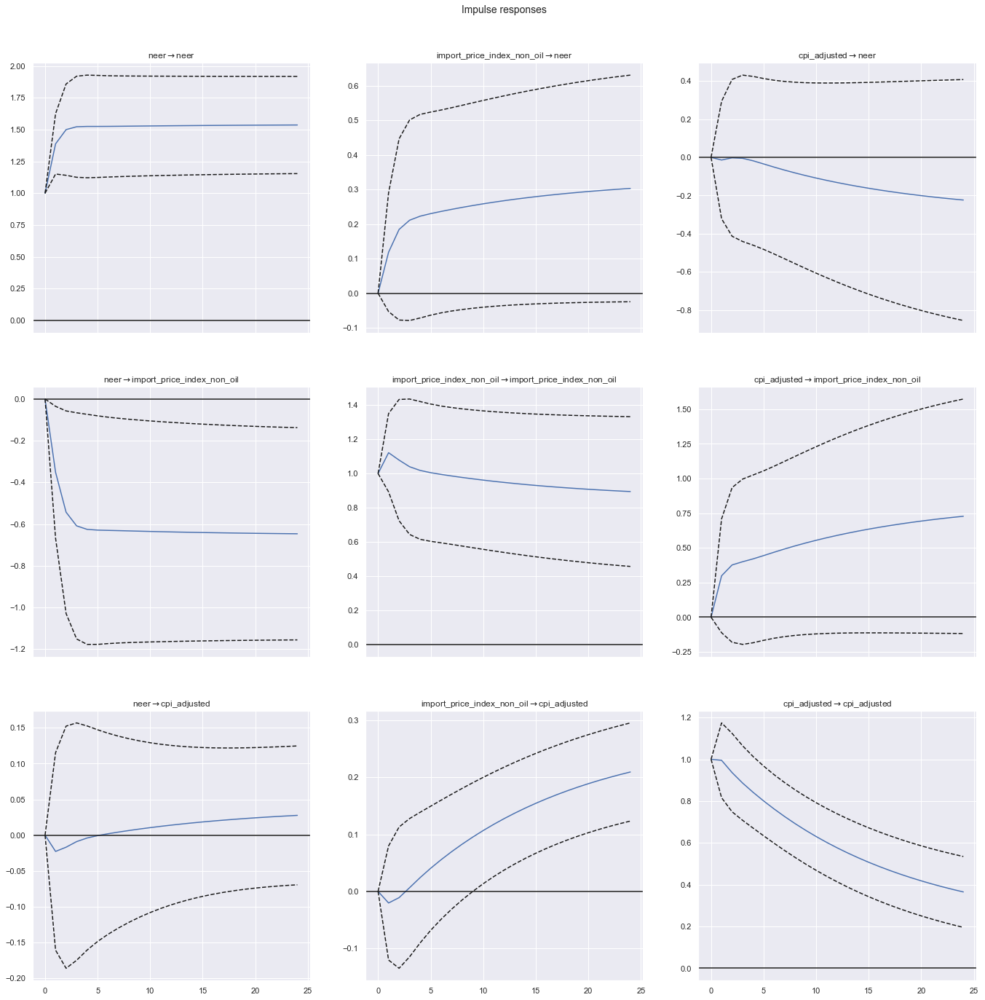

In [196]:
vecm_irf_plot = vecm_irf.plot(figsize=(20,20), orth=False)

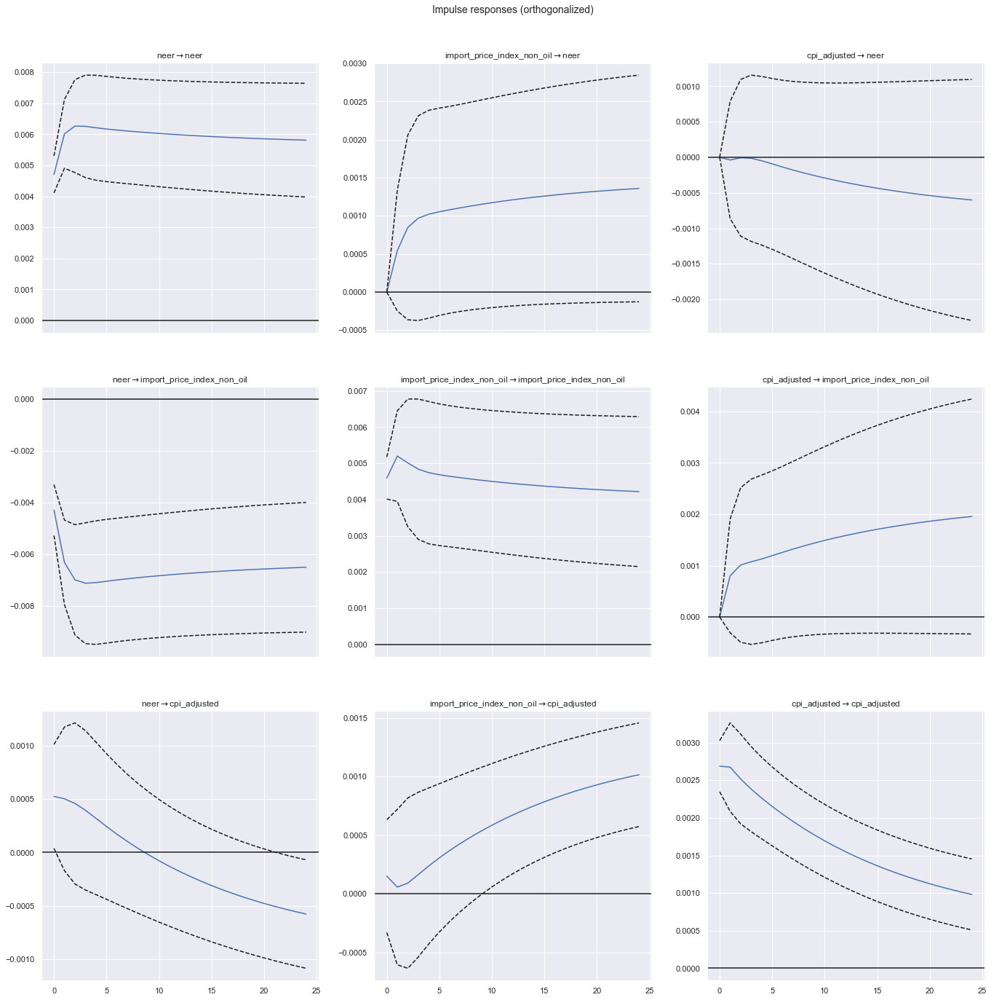

In [197]:
vecm_irf_plot = vecm_irf.plot(figsize=(20,20), orth=True)

# Heterogeneity Analysis

Consider the impact of NEER on different import price index and CPI components. Mappings are as follows:

1) `import_price_index_food` -> `cpi_adjusted_food`

2) `import_price_index_clothing` -> `cpi_adjusted_clothing`

3) `import_price_index_footwear` -> `cpi_adjusted_footwear`

4) `import_price_index_plumbing&lighting`, `import_price_index_furniture`, `import_price_index_electrical` -> `cpi_adjusted_household_durables`

5) `import_price_index_communication` -> `cpi_adjusted_communication`

6) `import_price_index_beverages&tobacco` -> `cpi_adjusted_misc`


## Time Series Analysis

### IPI (Food)

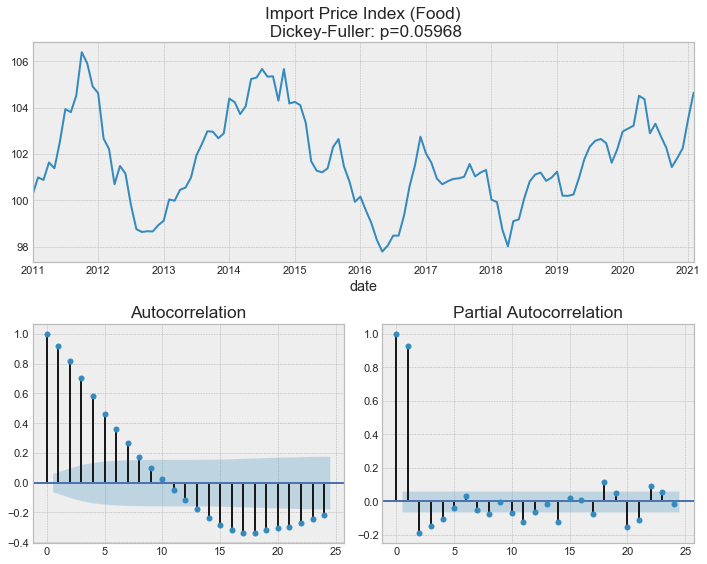

In [55]:
tsplot(data.import_price_index_food, lags = 24, title='Import Price Index (Food)')

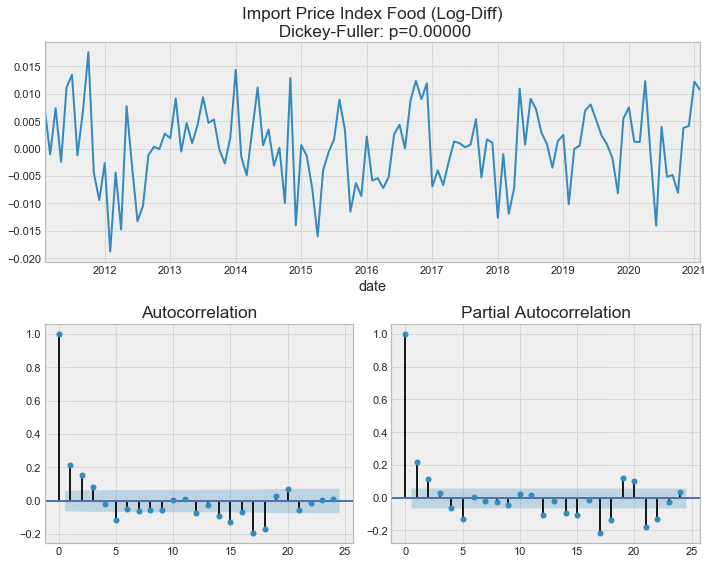

In [58]:
tsplot(np.log(data.import_price_index_food+1).diff().dropna(), lags = 24, title='Import Price Index Food (Log-Diff)')

### CPI Adjusted (Food)

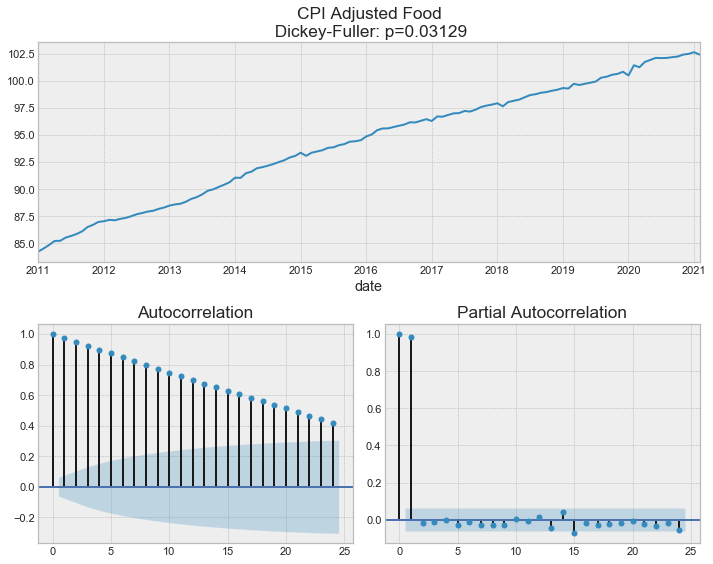

In [61]:
tsplot(data.cpi_adjusted_food, lags = 24, title='CPI Adjusted Food')

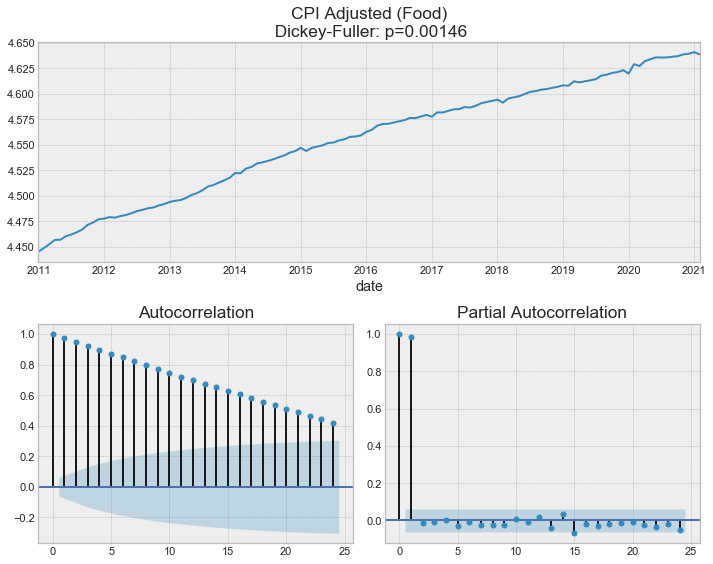

In [60]:
tsplot(np.log(data.cpi_adjusted_food+1), lags = 24, title='CPI Adjusted Food (Log)')

### IPI Clothing

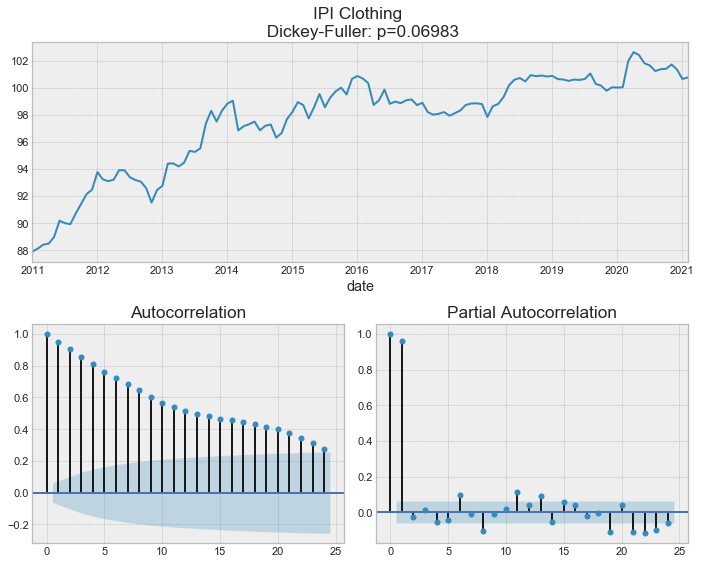

In [62]:
tsplot(data.import_price_index_clothing, lags = 24, title='IPI Clothing ')

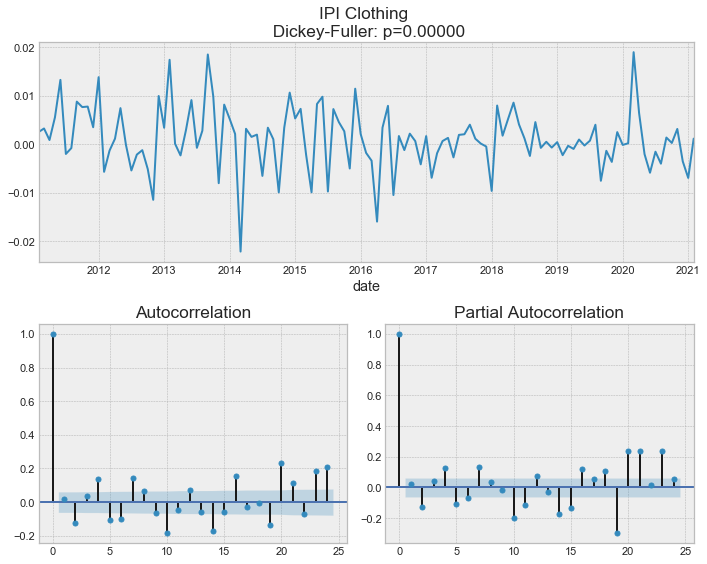

In [64]:
tsplot(np.log(data.import_price_index_clothing+1).diff().dropna(), lags = 24, title='IPI Clothing (Log-Diff) ')

### CPI Adjusted Clothing

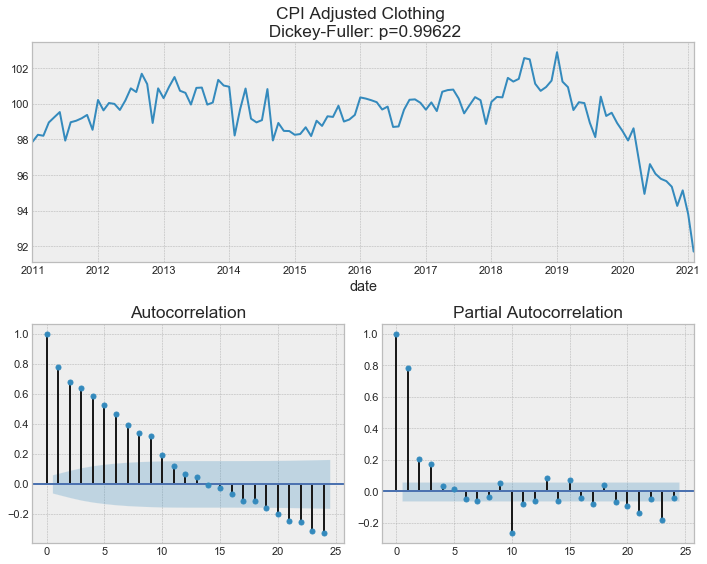

In [65]:
tsplot(data.cpi_adjusted_clothing, lags = 24, title='CPI Adjusted Clothing ')

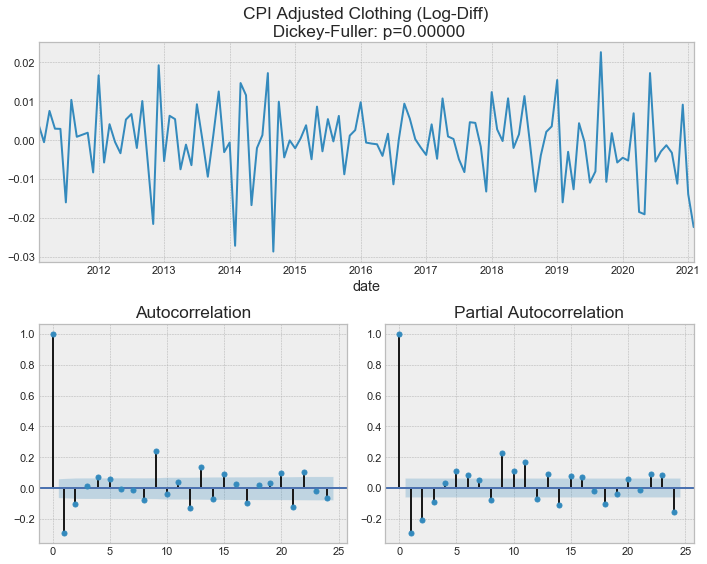

In [68]:
tsplot(np.log(data.cpi_adjusted_clothing+1).diff().dropna(), lags = 24, title='CPI Adjusted Clothing (Log-Diff)')

### IPI Footwear

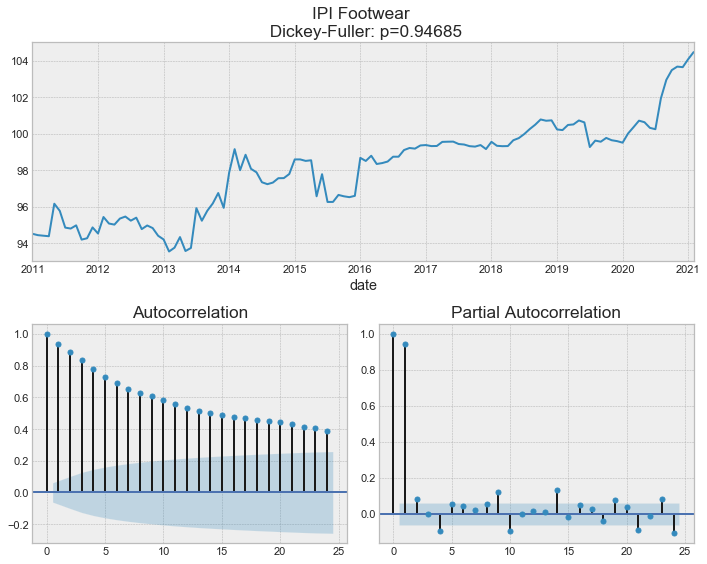

In [69]:
tsplot(data.import_price_index_footwear, lags = 24, title='IPI Footwear ')

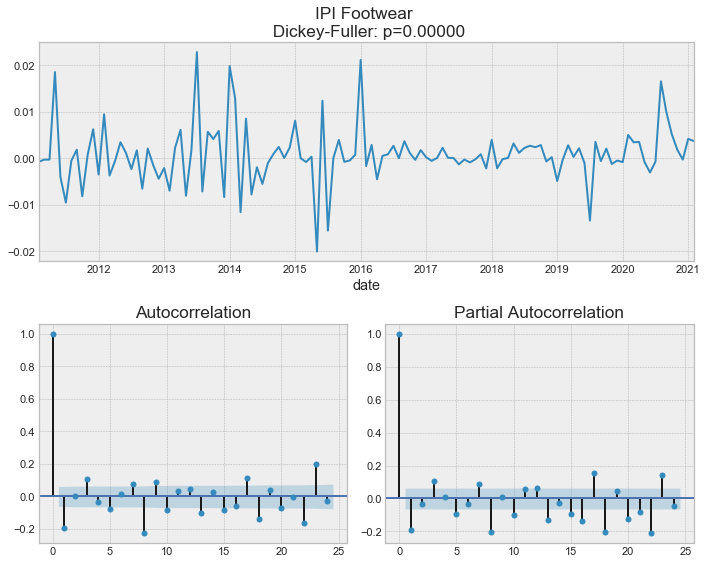

In [71]:
tsplot(np.log(data.import_price_index_footwear+1).diff().dropna(), lags = 24, title='IPI Footwear (Log-Diff) ')

### CPI Adjusted Footwear

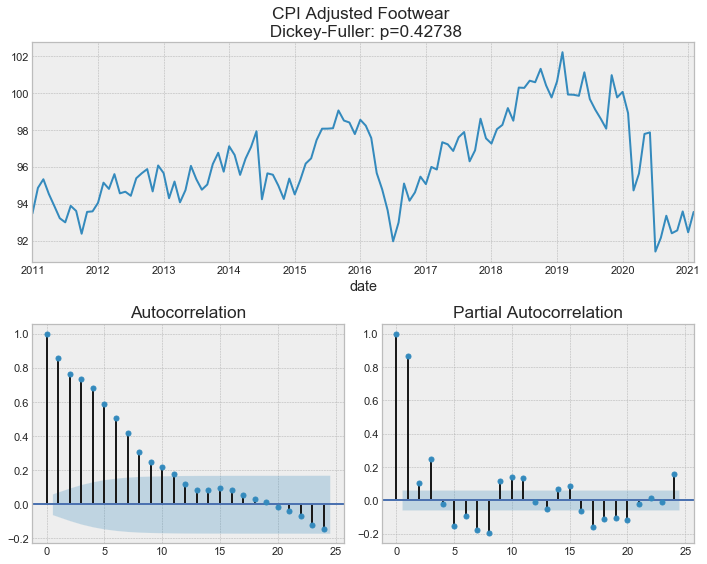

In [72]:
tsplot(data.cpi_adjusted_footwear, lags = 24, title='CPI Adjusted Footwear')

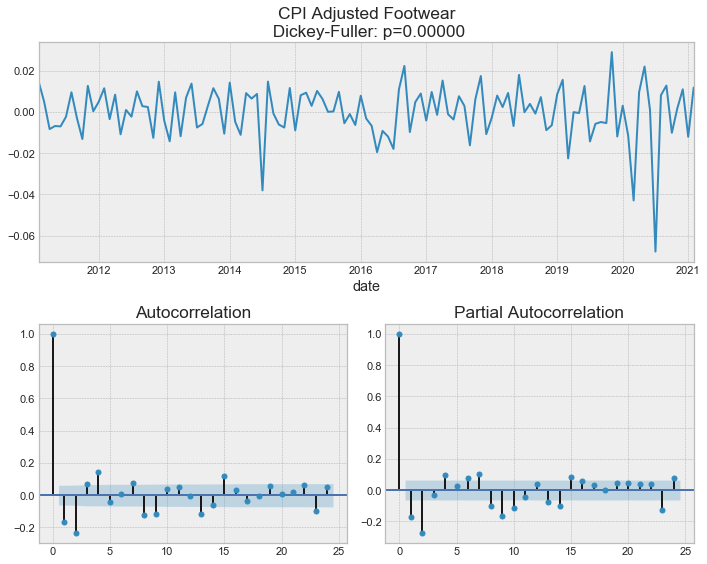

In [74]:
tsplot(np.log(data.cpi_adjusted_footwear+1).diff().dropna(), lags = 24, title='CPI Adjusted Footwear')

### Import Price Index Plumbing & Lighting

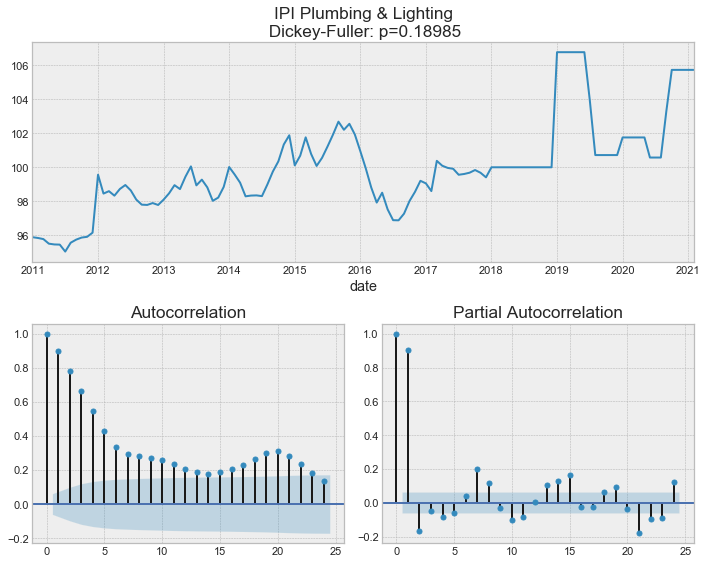

In [76]:
tsplot(data['import_price_index_plumbing&lighting'], lags = 24, title='IPI Plumbing & Lighting')

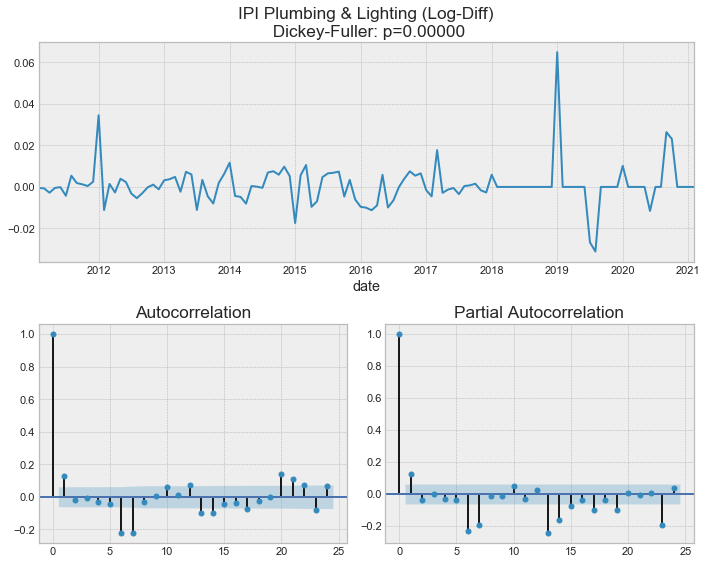

In [79]:
tsplot(np.log(data['import_price_index_plumbing&lighting']+1).diff().dropna(), lags = 24, title='IPI Plumbing & Lighting (Log-Diff)')

### Import Price Index Furniture

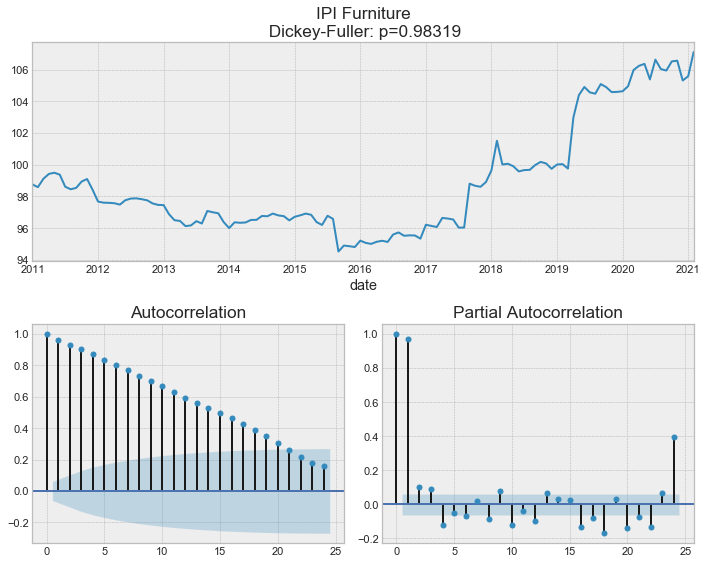

In [80]:
tsplot(data['import_price_index_furniture'], lags = 24, title='IPI Furniture')

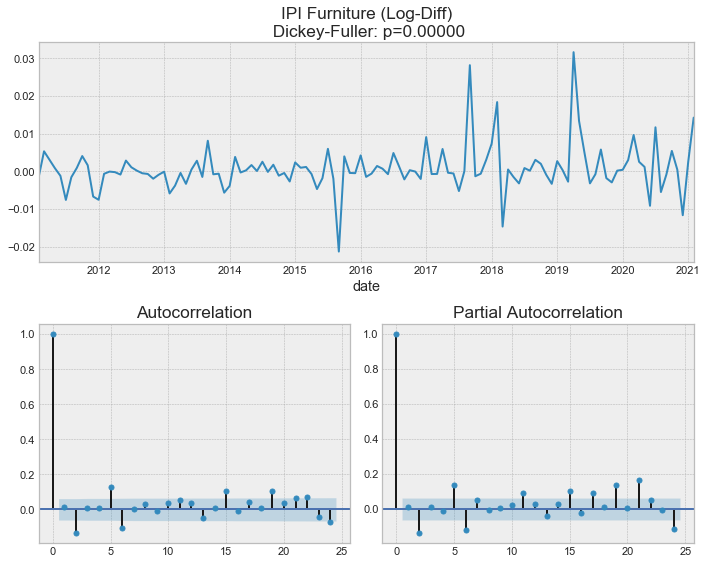

In [83]:
tsplot(np.log(data['import_price_index_furniture']+1).diff().dropna(), lags = 24, title='IPI Furniture (Log-Diff)')

### Import Price Index Electrical

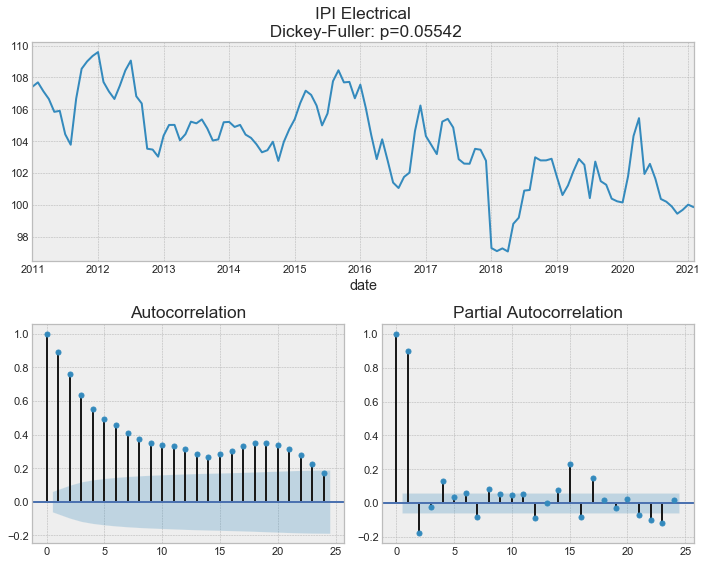

In [84]:
tsplot(data['import_price_index_electrical'], lags = 24, title='IPI Electrical')

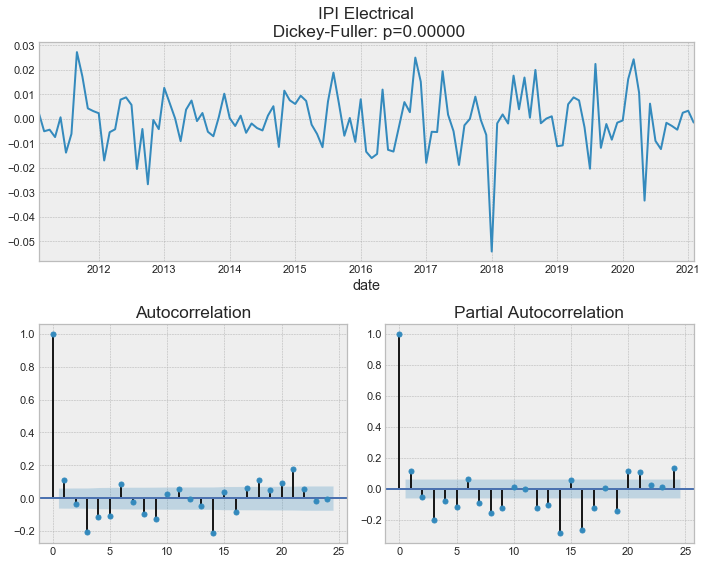

In [86]:
tsplot(np.log(data['import_price_index_electrical']+1).diff().dropna(), lags = 24, title='IPI Electrical (Log-Diff)')

### CPI Adjusted Household Durables

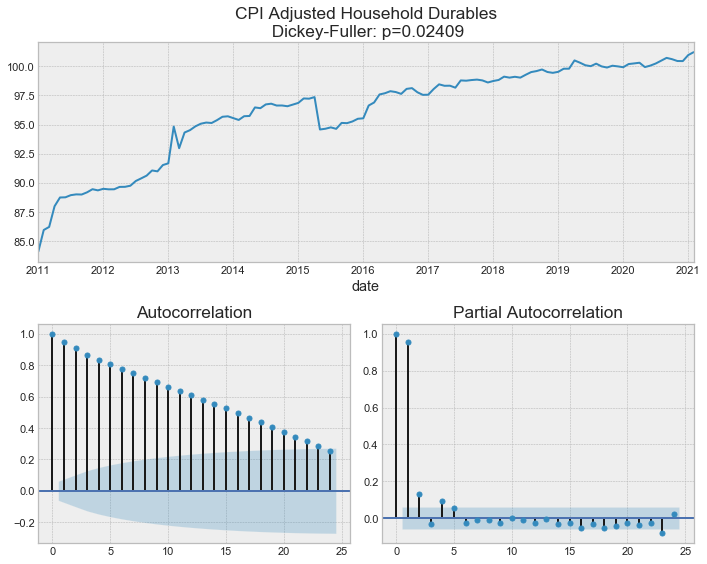

In [87]:
tsplot(data['cpi_adjusted_household_durables'], lags = 24, title='CPI Adjusted Household Durables')

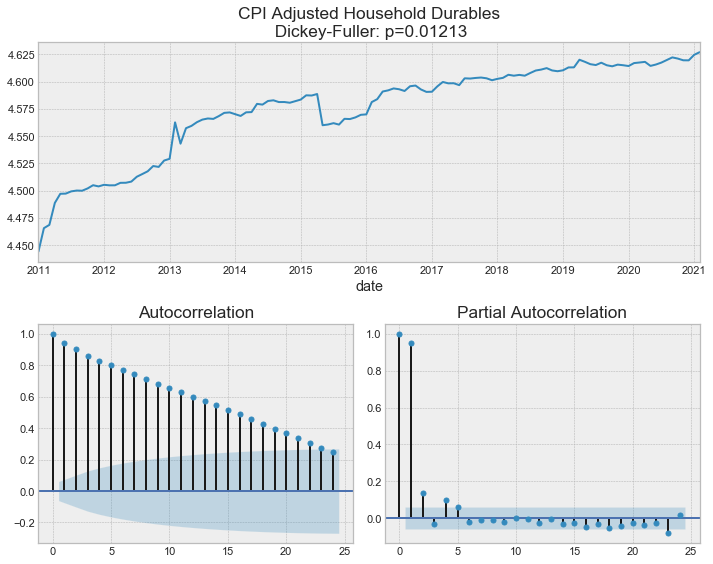

In [88]:
tsplot(np.log(data['cpi_adjusted_household_durables']+1), lags = 24, title='CPI Adjusted Household Durables')

### Import Price Index Communication

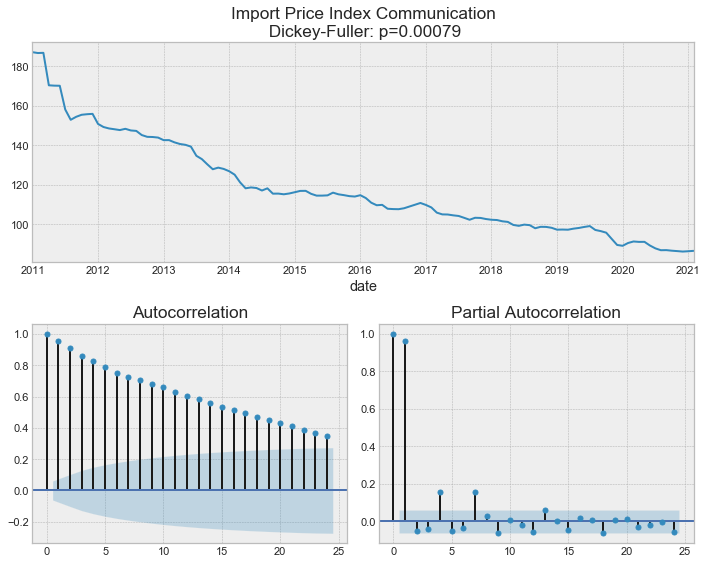

In [90]:
tsplot(data['import_price_index_communication'], lags = 24, title='Import Price Index Communication')

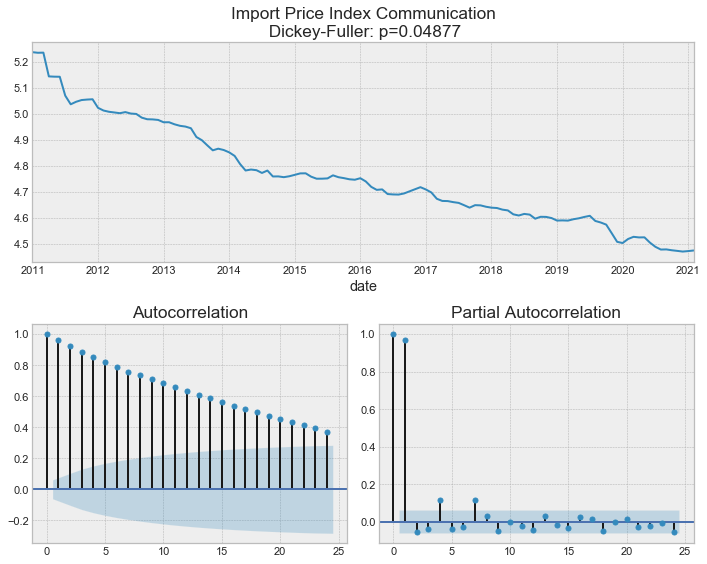

In [91]:
tsplot(np.log(data['import_price_index_communication']+1), lags = 24, title='Import Price Index Communication')

### CPI Adjusted Communication

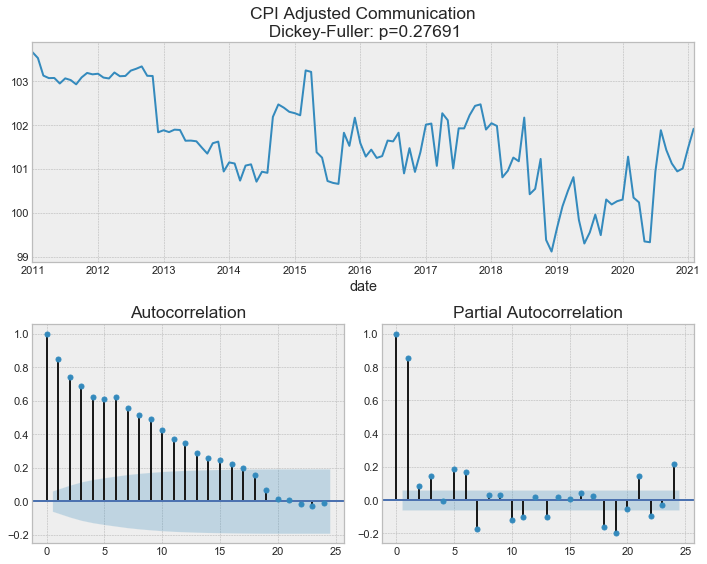

In [92]:
tsplot(data['cpi_adjusted_communication'], lags = 24, title='CPI Adjusted Communication')

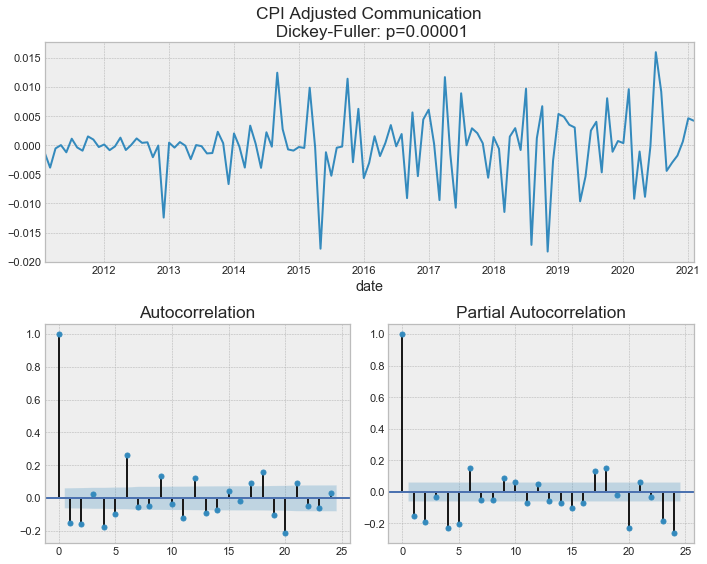

In [94]:
tsplot(np.log(data['cpi_adjusted_communication']+1).diff().dropna(), lags = 24, title='CPI Adjusted Communication')

### Import Price Index Beverages & Tobacco

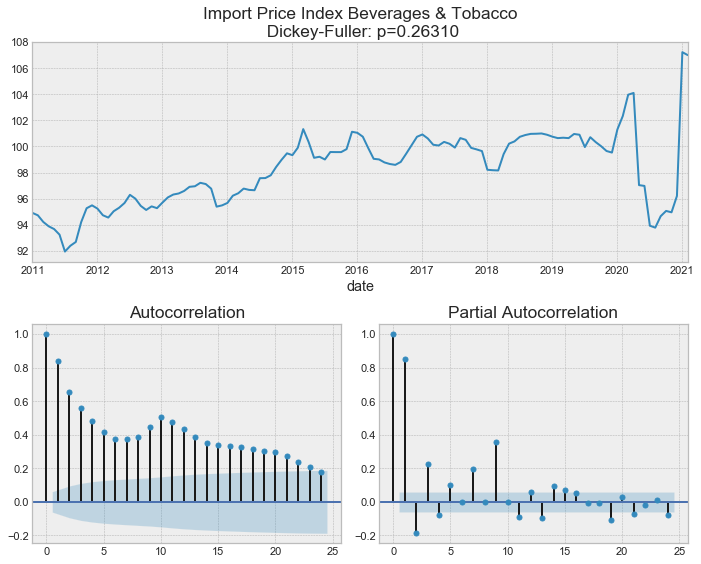

In [95]:
tsplot(data['import_price_index_beverages&tobacco'], lags = 24, title='Import Price Index Beverages & Tobacco')

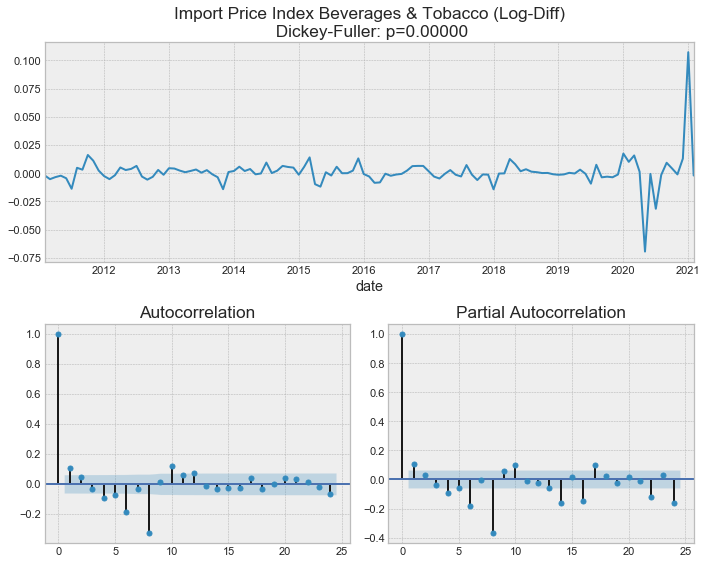

In [98]:
tsplot(np.log(data['import_price_index_beverages&tobacco']+1).diff().dropna(), lags = 24, title='Import Price Index Beverages & Tobacco (Log-Diff)')

### CPI Adjusted Misc

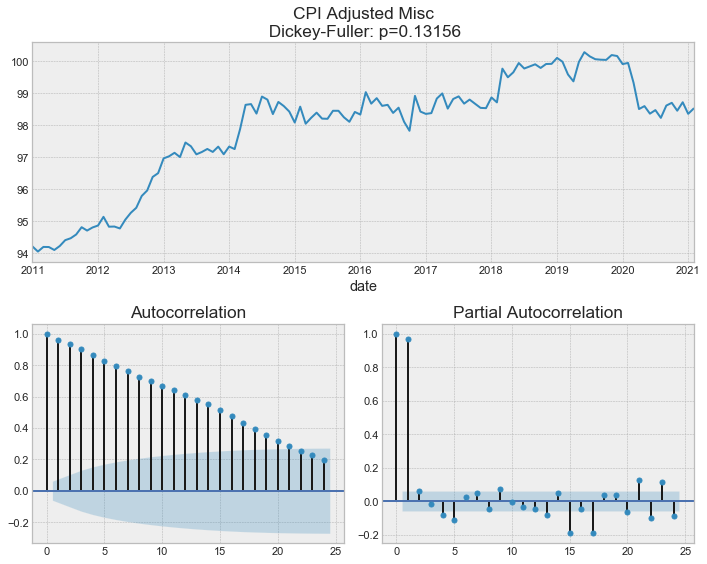

In [99]:
tsplot(data['cpi_adjusted_misc'], lags = 24, title='CPI Adjusted Misc')

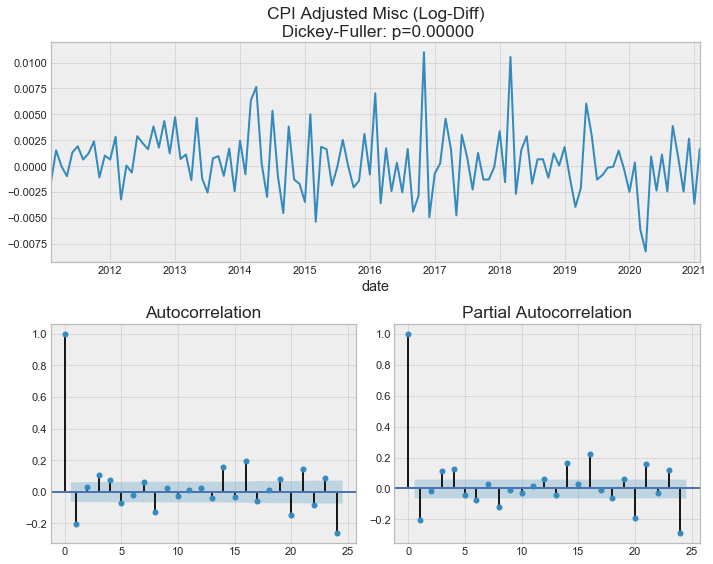

In [102]:
tsplot(np.log(data['cpi_adjusted_misc']+1).diff().dropna(), lags = 24, title='CPI Adjusted Misc (Log-Diff)')

Transformations: 
- import_price_index_food: log-diff
- cpi_adjusted_food: log
- import_price_index_clothing: log-diff
- cpi_adjusted_clothing: log-diff
- import_price_index_footwear: log-diff
- cpi_adjusted_footwear: log-diff
- import_price_index_plumbing&lighting: log-diff
- import_price_index_furniture: log-diff
- import_price_index_electrical: log-diff
- cpi_adjusted_household_durables: log
- import_price_index_communication: log
- cpi_adjusted_communication: log-diff
- import_price_index_beverages&tobacco: log-diff
- cpi_adjusted_misc: log-diff

## VAR Model

In [133]:
data.columns

Index(['neer', 'cpi_adjusted', 'export_price_index', 'import_price_index',
       'export_price_index_machinery', 'export_price_index_manufactured',
       'export_price_index_chem', 'export_price_index_misc_manufactured',
       'export_price_index_mineral_fuels', 'cpi_adjusted_clothing_footwear',
       'cpi_adjusted_education', 'cpi_adjusted_healthcare',
       'cpi_adjusted_transport', 'cpi_adjusted_recreation',
       'cpi_adjusted_housing_utilities', 'import_price_index_non_oil',
       'import_price_index_food', 'cpi_adjusted_food',
       'import_price_index_clothing', 'cpi_adjusted_clothing',
       'import_price_index_footwear', 'cpi_adjusted_footwear',
       'import_price_index_plumbing&lighting', 'import_price_index_furniture',
       'import_price_index_electrical', 'cpi_adjusted_household_durables',
       'import_price_index_communication', 'cpi_adjusted_communication',
       'import_price_index_beverages&tobacco', 'cpi_adjusted_misc'],
      dtype='object')

In [204]:
data_trans = pd.concat([
    np.log(data.neer+1).diff().dropna(),
    np.log(data.import_price_index_food+1).diff().dropna(),
    np.log(data.cpi_adjusted_food+1),
    np.log(data.import_price_index_clothing+1).diff().dropna(),
    np.log(data.cpi_adjusted_clothing+1).diff().dropna(),
    np.log(data.import_price_index_footwear+1).diff().dropna(),
    np.log(data.cpi_adjusted_footwear+1).diff().dropna(),
    np.log(data['import_price_index_plumbing&lighting']+1).diff().dropna(),
    np.log(data.import_price_index_furniture+1).diff().dropna(),
    np.log(data.import_price_index_electrical+1).diff().dropna(),
    np.log(data.cpi_adjusted_household_durables+1),
    np.log(data.import_price_index_communication+1),
    np.log(data.cpi_adjusted_communication+1).diff().dropna(),
    np.log(data['import_price_index_beverages&tobacco']+1).diff().dropna(),
    np.log(data.cpi_adjusted_misc+1).diff().dropna(),
    
], axis = 1)
data_trans = data_trans.iloc[1:] #if not all cols use diff
 

In [205]:
data_trans.columns

Index(['neer', 'import_price_index_food', 'cpi_adjusted_food',
       'import_price_index_clothing', 'cpi_adjusted_clothing',
       'import_price_index_footwear', 'cpi_adjusted_footwear',
       'import_price_index_plumbing&lighting', 'import_price_index_furniture',
       'import_price_index_electrical', 'cpi_adjusted_household_durables',
       'import_price_index_communication', 'cpi_adjusted_communication',
       'import_price_index_beverages&tobacco', 'cpi_adjusted_misc'],
      dtype='object')

In [206]:
from statsmodels.tsa.api import VAR
order = 6
model = VAR(data_trans)
model.select_order(order).summary()

,AIC,BIC,FPE,HQIC
0,-141.6,-141.3,3.098e-62,-141.5
1,-150.9,-145.1*,3.110e-66*,-148.5*
2,-150.4,-139.3,6.026e-66,-145.9
3,-149.7,-133.2,2.064e-65,-143.0
4,-150.2,-128.3,3.689e-65,-141.3
5,-152.0,-124.8,5.533e-65,-140.9
6,-158.2*,-125.6,9.500e-66,-145.0


In [207]:
orders = model.select_order(order).selected_orders

for o in orders.values():
    if o == 0:
        continue
    print(f'Order: {o}')
    results = model.fit(o)
    print(results.is_stable())
    print(results.test_whiteness())
    print()


Order: 6
False
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: reject at 5% significance level. Test statistic: 2622.284, critical value: 970.904>, p-value: 0.000>

Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 1918.017, critical value: 2130.802>, p-value: 0.956>

Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 1918.017, critical value: 2130.802>, p-value: 0.956>

Order: 1
True
<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 1918.017, critical value: 2130.802

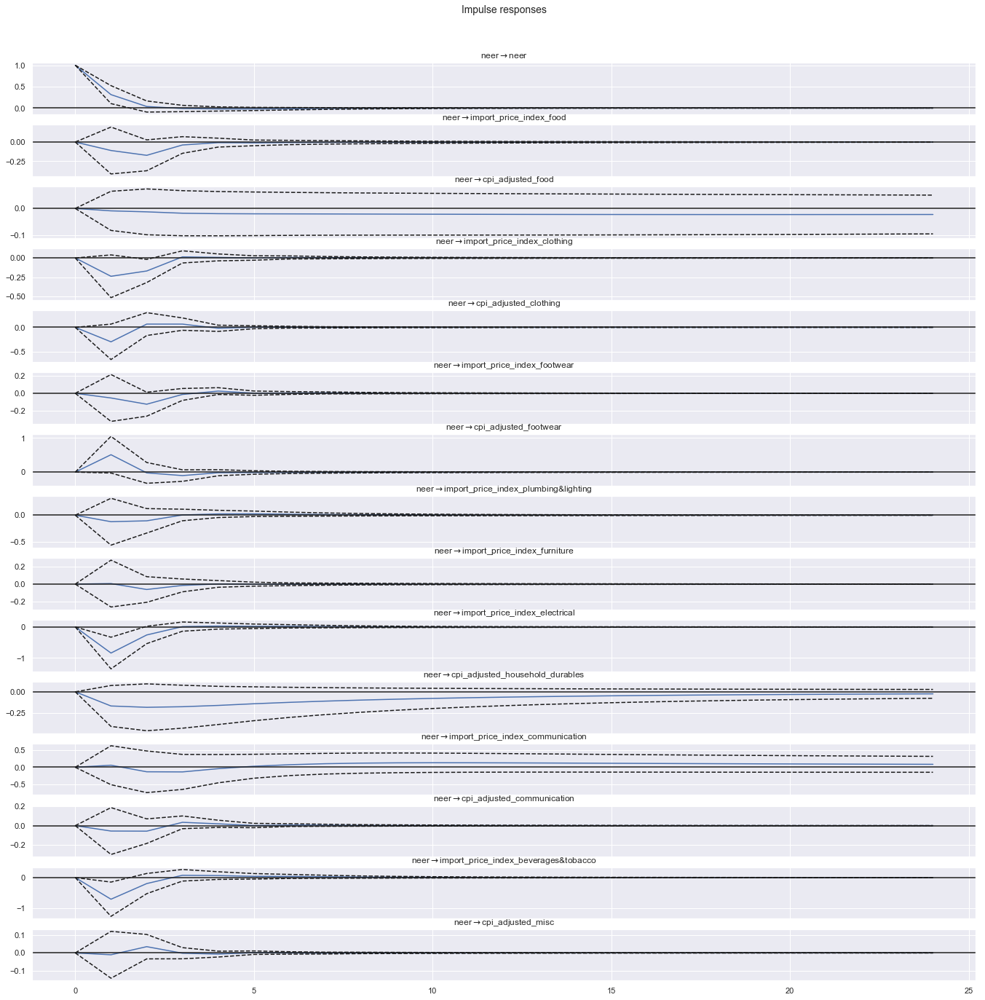

In [208]:
results = model.fit(1)
irf = results.irf(24)
irf_plot = irf.plot(orth=False,figsize=(20,20), impulse='neer')

In [209]:
data_trans.columns

Index(['neer', 'import_price_index_food', 'cpi_adjusted_food',
       'import_price_index_clothing', 'cpi_adjusted_clothing',
       'import_price_index_footwear', 'cpi_adjusted_footwear',
       'import_price_index_plumbing&lighting', 'import_price_index_furniture',
       'import_price_index_electrical', 'cpi_adjusted_household_durables',
       'import_price_index_communication', 'cpi_adjusted_communication',
       'import_price_index_beverages&tobacco', 'cpi_adjusted_misc'],
      dtype='object')

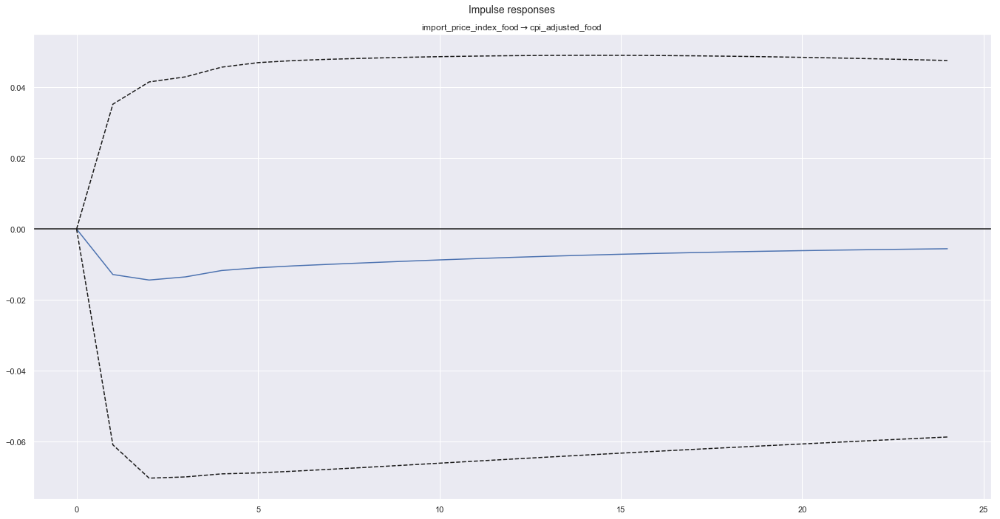

In [210]:
irf_plot = irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_food', response='cpi_adjusted_food')

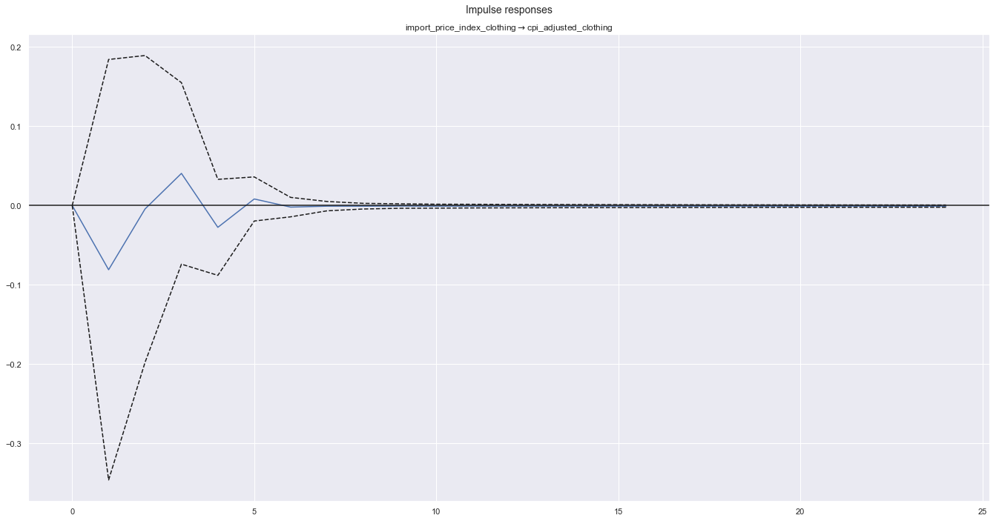

In [211]:
irf_plot = irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_clothing', response='cpi_adjusted_clothing')

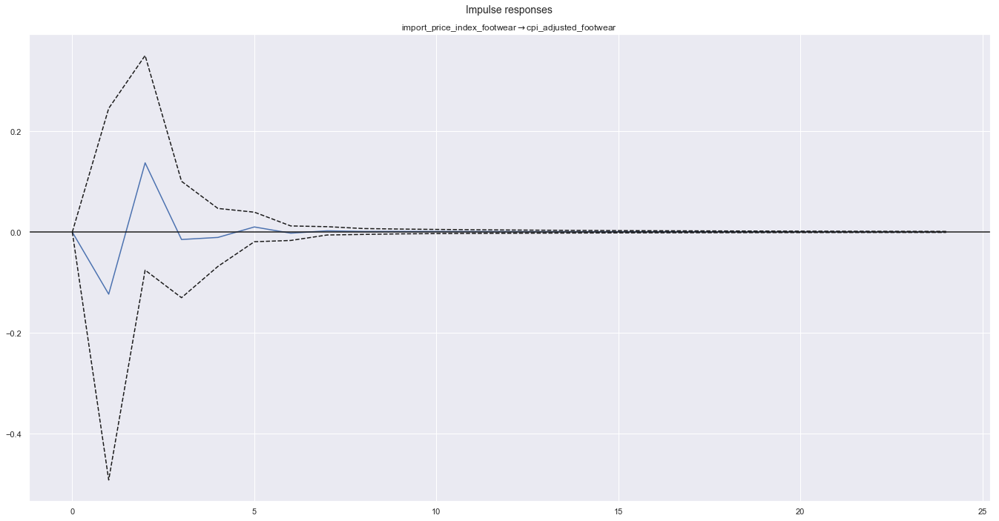

In [212]:
irf_plot = irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_footwear', response='cpi_adjusted_footwear')

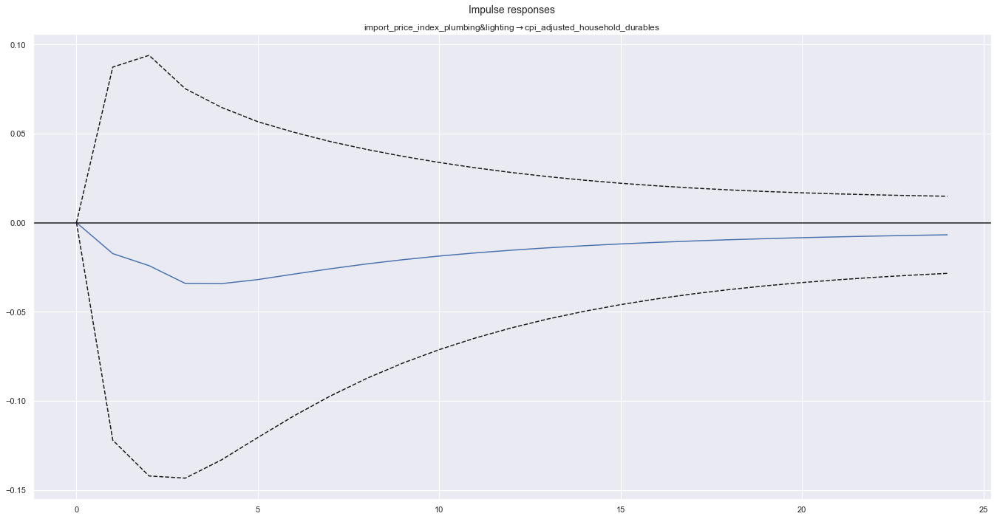

In [213]:
irf_plot = irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_plumbing&lighting',
                    response='cpi_adjusted_household_durables')

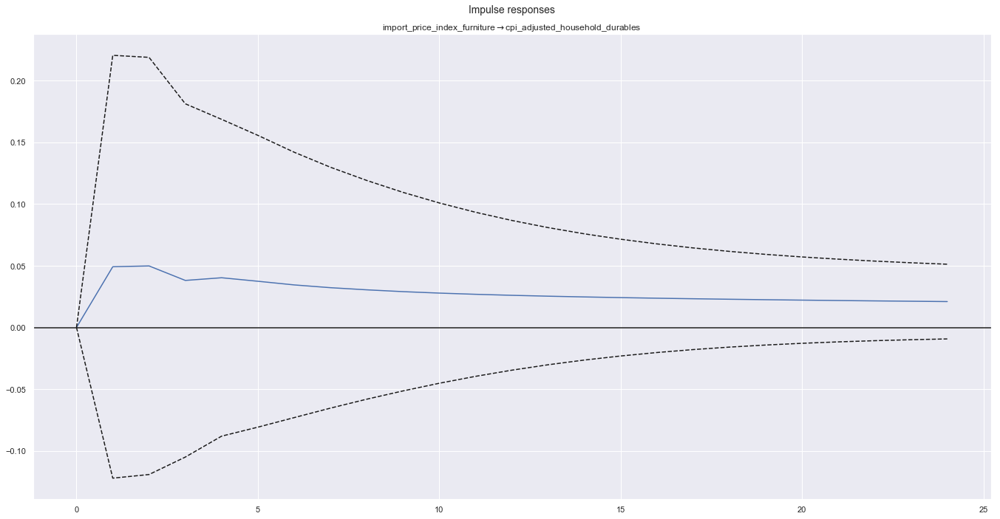

In [214]:
irf_plot = irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_furniture',
                    response='cpi_adjusted_household_durables')

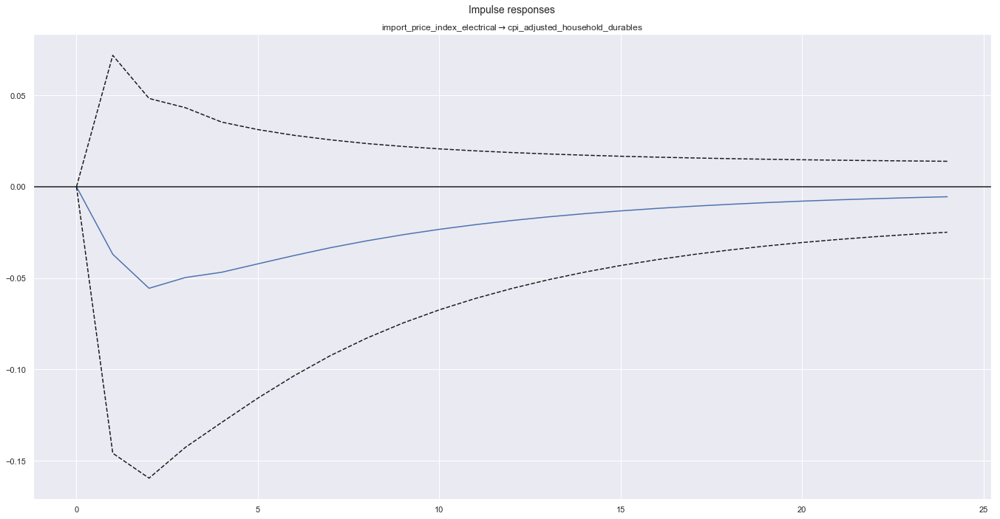

In [215]:
irf_plot = irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_electrical',
                    response='cpi_adjusted_household_durables')

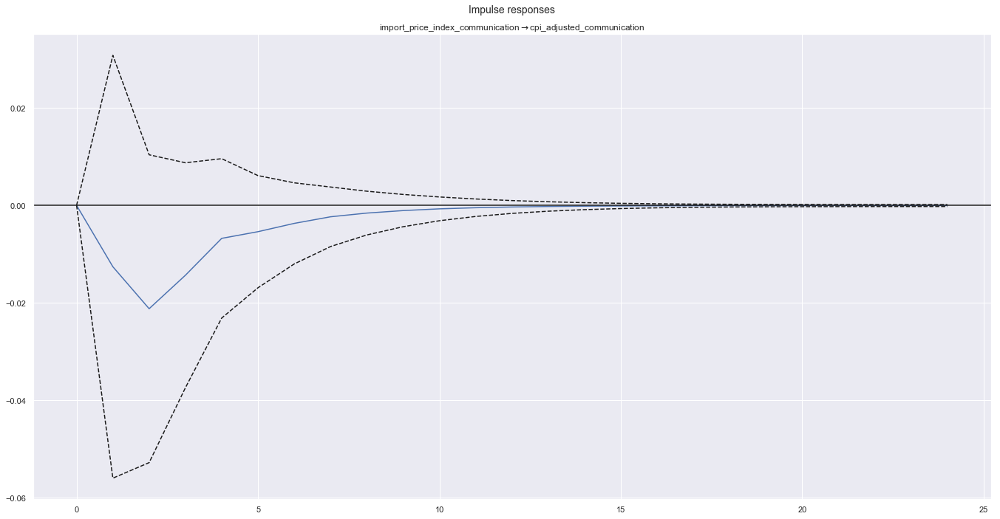

In [216]:
irf_plot = irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_communication', response='cpi_adjusted_communication')

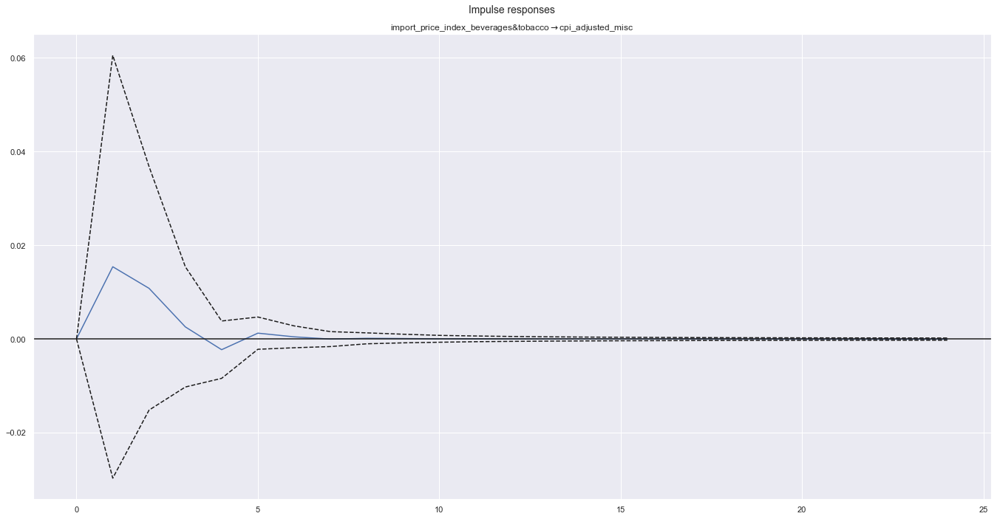

In [217]:
irf_plot = irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_beverages&tobacco', response='cpi_adjusted_misc')

In [218]:
cols = ['neer', 'import_price_index_food', 'cpi_adjusted_food',
       'import_price_index_clothing', 'cpi_adjusted_clothing',
       'import_price_index_footwear', 'cpi_adjusted_footwear',
       'import_price_index_plumbing&lighting', 'import_price_index_furniture',
       'import_price_index_electrical', 'cpi_adjusted_household_durables',
       'import_price_index_communication', 'cpi_adjusted_communication',
       'import_price_index_beverages&tobacco', 'cpi_adjusted_misc']

coint_results = coint_johansen(np.log(data[cols]+1), det_order=0, k_ar_diff=1)
print_coint_results(coint_results)


--------------------------------------------------
--> Trace Statistics
variable statistic Crit-90% Crit-95%  Crit-99%
r = 0 	 594.3046 nan nan nan
r = 1 	 478.2416 nan nan nan
r = 2 	 396.8075 nan nan nan
r = 3 	 326.7252 326.5354 334.9795 351.215
r = 4 	 268.1164 277.374 285.1402 300.2821
r = 5 	 220.08 232.103 239.2468 253.2526
r = 6 	 175.9568 190.8714 197.3772 210.0366
r = 7 	 140.9052 153.6341 159.529 171.0905
r = 8 	 110.1632 120.3673 125.6185 135.9825
r = 9 	 81.8667 91.109 95.7542 104.9637
r = 10 	 54.5026 65.8202 69.8189 77.8202
r = 11 	 33.5578 44.4929 47.8545 54.6815
r = 12 	 17.1112 27.0669 29.7961 35.4628
r = 13 	 6.5715 13.4294 15.4943 19.9349
r = 14 	 0.58 2.7055 3.8415 6.6349
--------------------------------------------------


C:\Users\Reverse\AppData\Local\Programs\Python\Python37\lib\site-packages\statsmodels\tsa\vector_ar\vecm.py:579: HypothesisTestWarning: Critical values are only available for time series with 12 variables at most.
  category=HypothesisTestWarning)


In [155]:
vecm_model = VECM(endog = np.log(data[cols]+1), k_ar_diff = 1, coint_rank = 1, deterministic = 'co')
vecm_fit = vecm_model.fit()
vecm_fit.summary()
print(vecm_fit.test_whiteness())

<statsmodels.tsa.vector_ar.hypothesis_test_results.WhitenessTestResults object. H_0: residual autocorrelation up to lag 10 is zero: fail to reject at 5% significance level. Test statistic: 1858.836, critical value: 2115.414>, p-value: 0.993>


C:\Users\Reverse\AppData\Local\Programs\Python\Python37\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


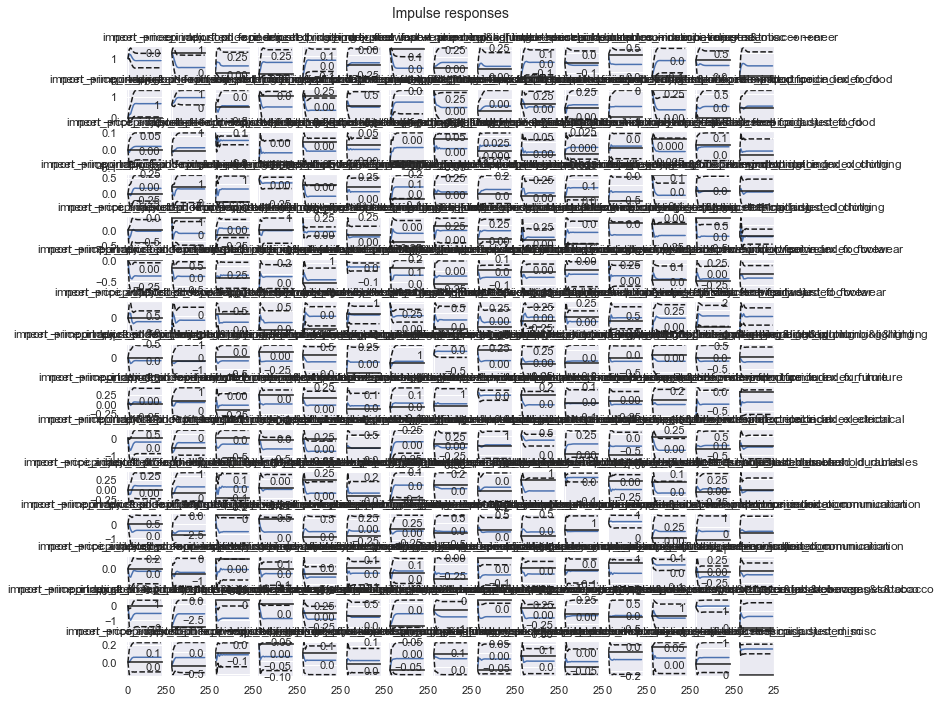

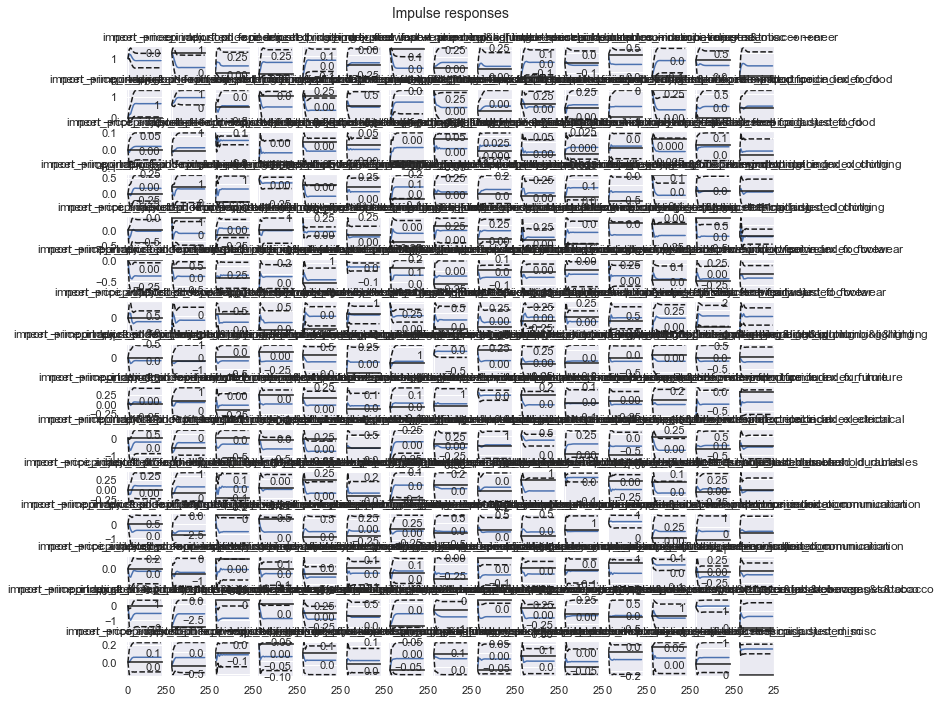

In [157]:
vecm_irf = vecm_fit.irf(24)


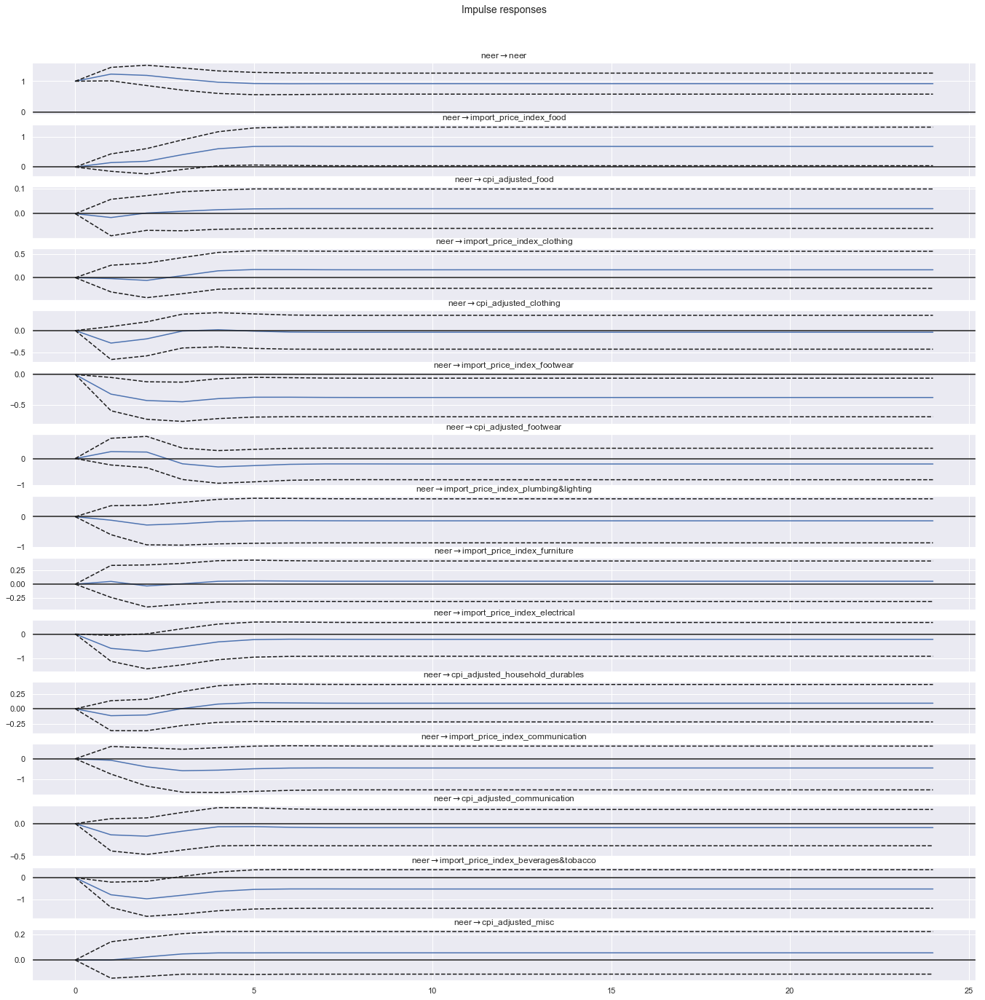

In [166]:
irf_plot = vecm_irf.plot(orth=False, figsize=(20,20), impulse='neer')

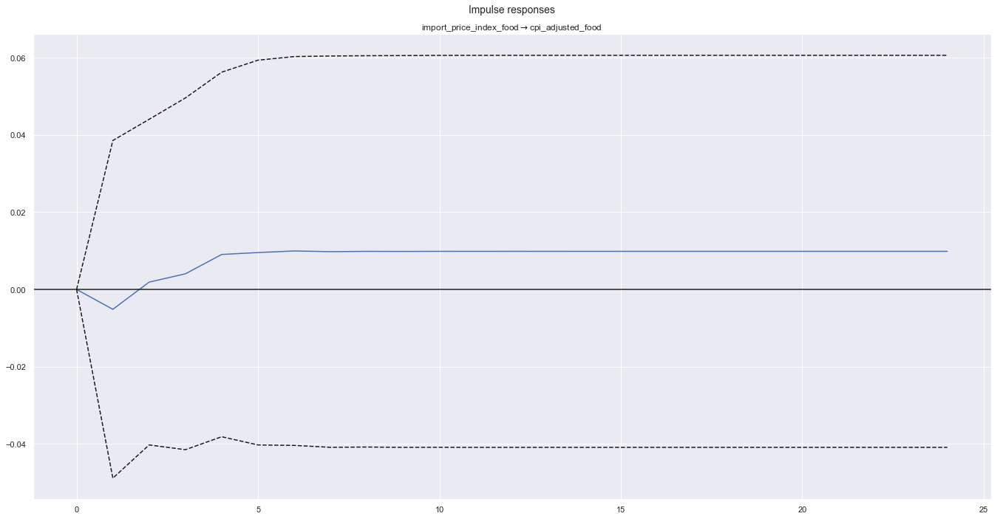

In [158]:
irf_plot = vecm_irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_food', response='cpi_adjusted_food')

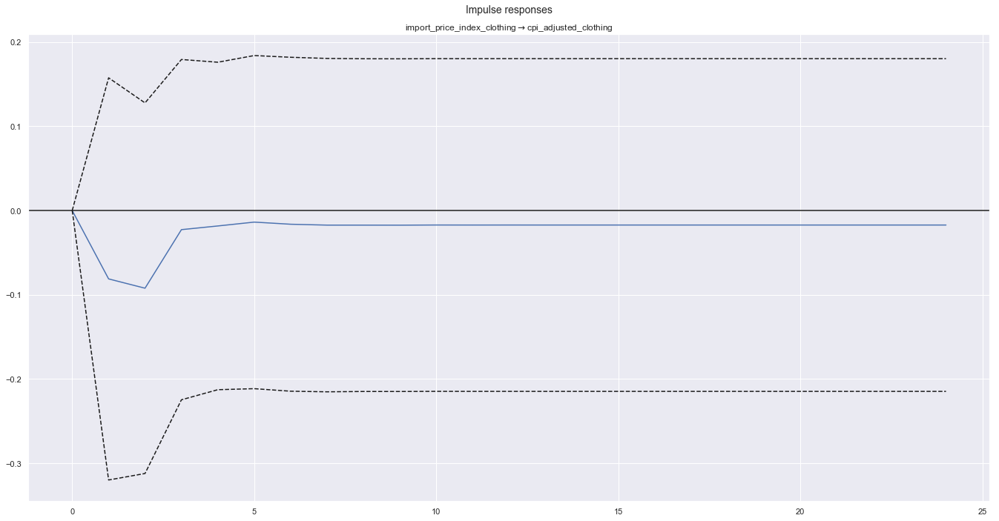

In [160]:
irf_plot = vecm_irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_clothing', response='cpi_adjusted_clothing')

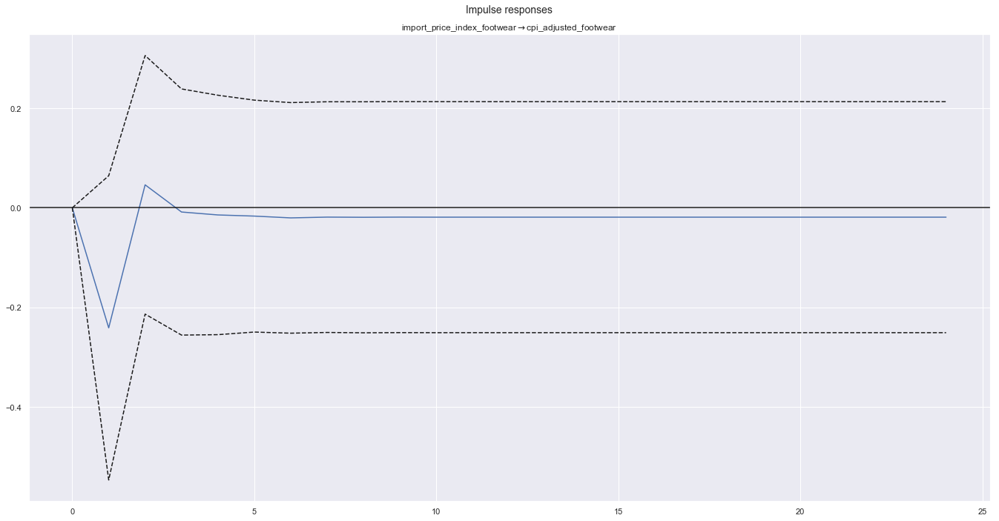

In [161]:
irf_plot = vecm_irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_footwear', response='cpi_adjusted_footwear')

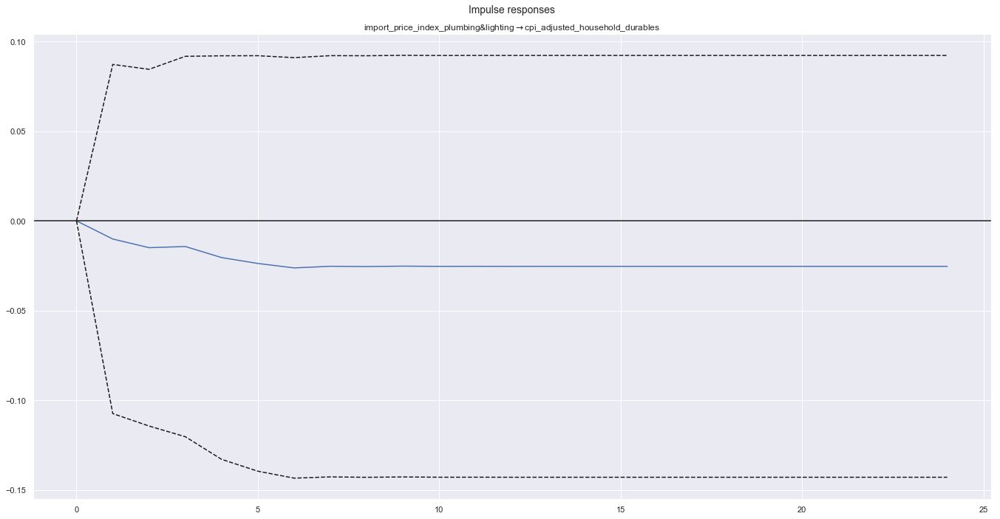

In [162]:
irf_plot = vecm_irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_plumbing&lighting',
                    response='cpi_adjusted_household_durables')

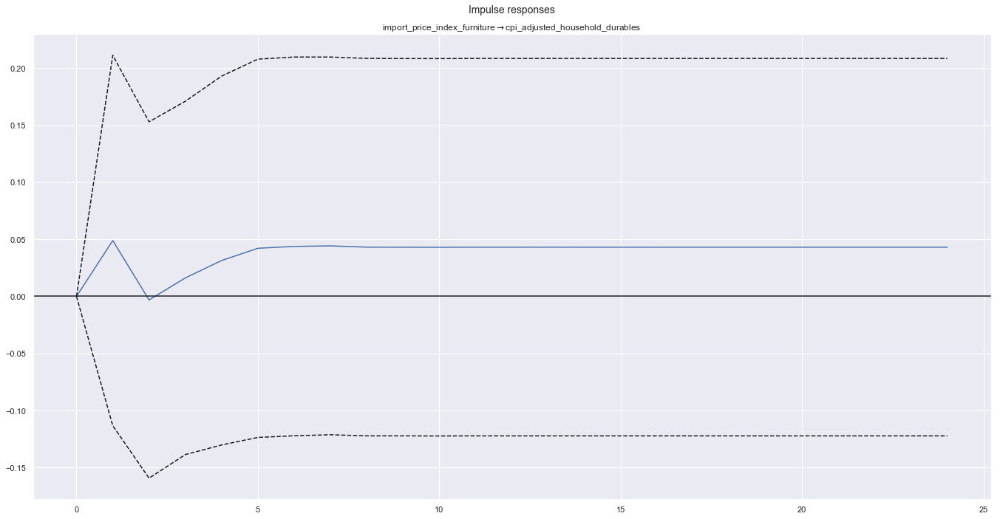

In [163]:
irf_plot = vecm_irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_furniture',
                    response='cpi_adjusted_household_durables')

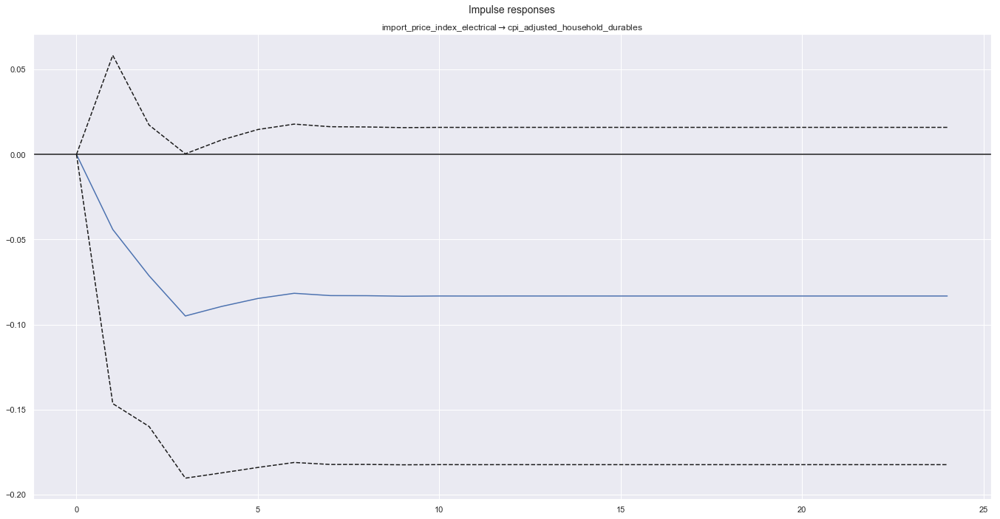

In [164]:
irf_plot = vecm_irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_electrical',
                    response='cpi_adjusted_household_durables')

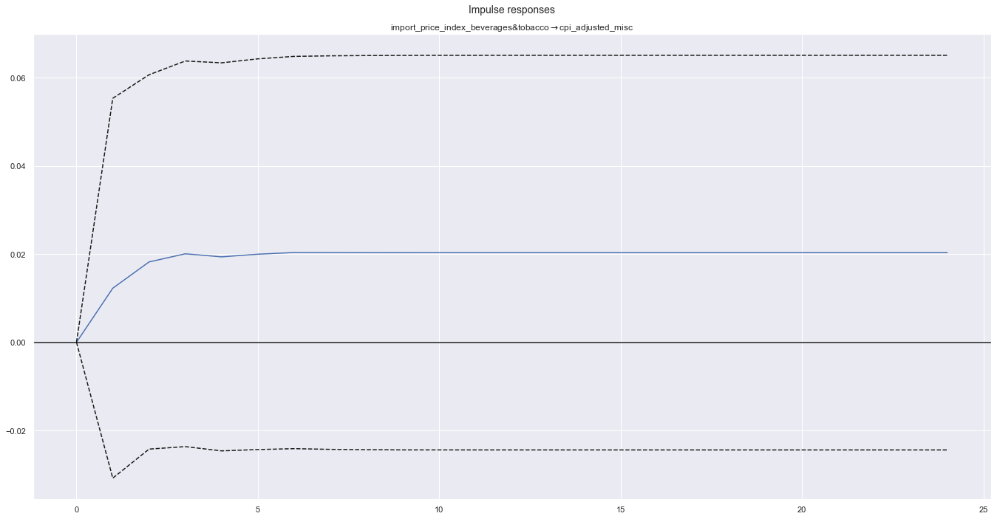

In [165]:
irf_plot = vecm_irf.plot(orth=False, figsize=(20,10), impulse='import_price_index_beverages&tobacco', response='cpi_adjusted_misc')